#**PROJETO 1**
##**Modelo de Concessão de Crédito**



#Imports

In [ ]:
# Bibliotecas padrão
import random

# Bibliotecas numéricas e de dados
import numpy as np
import pandas as pd

# Visualização - Matplotlib/Seaborn
import matplotlib.pyplot as plt
import seaborn as sns

# Visualização - Plotly
import plotly.express as px

# Scikit-learn - Model selection
from sklearn.model_selection import ParameterGrid

# Scikit-learn - Métricas
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve
)
from sklearn.utils.class_weight import compute_class_weight

# LightGBM
import lightgbm as lgb

# Joblib
import joblib

#Importando Dados

In [ ]:
#Paths dados
path_train = 'Data/train'
path_test = 'Data/test'
path_oot = 'Data/oot'

In [ ]:
#Transformando em DataFrames
data_train = pd.read_csv(path_train)
data_test = pd.read_csv(path_test)
data_oot = pd.read_csv(path_oot)

#AED — Análise Exploratória dos Dados

##Visão Geral

In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120750 entries, 0 to 120749
Columns: 151 entries, REF_DATE to ID
dtypes: float64(34), int64(3), object(114)
memory usage: 139.1+ MB


In [ ]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51751 entries, 0 to 51750
Columns: 151 entries, REF_DATE to ID
dtypes: float64(34), int64(3), object(114)
memory usage: 59.6+ MB


In [ ]:
data_oot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91965 entries, 0 to 91964
Columns: 150 entries, REF_DATE to ID
dtypes: float64(34), int64(2), object(114)
memory usage: 105.2+ MB


Vamos olhar as colunas dos nossos dados(Considerando que train e test tem as mesmas colunas e oot não possui TARGET)

In [ ]:
data_train.columns

Index(['REF_DATE', 'TARGET', 'VAR2', 'IDADE', 'VAR4', 'VAR5', 'VAR6', 'VAR7',
       'VAR8', 'VAR9',
       ...
       'VAR141', 'VAR142', 'VAR143', 'VAR144', 'VAR145', 'VAR146', 'VAR147',
       'VAR148', 'VAR149', 'ID'],
      dtype='object', length=151)

**Visão Geral dos Dados:**


*   **Train e Test**: tem 151 colunas,incluindo *TARGET*
*   **OOT**: tem 150 colunas, não possui a coluna *TARGET*, logo será usada como inferência para o nosso modelo.


---



**Analisando as Colunas:**


*   **ID:** é a *PK* da base de dados
*   **TARGET:** variável binária e alvo, sendo:

    0- Bom Pagador

    1- Mau Pagador
*   **IDADE:** Idade do cliente, sendo essencial para a política AS-IS
*   **REF_DATE:** data de referência.
*   **DEMAIS VARS:** Conjunto de features mascaradas para treino do modelo.





In [ ]:
data_train['IDADE'].head()

,IDADE
0,34.137
1,40.447
2,33.515
3,25.797
4,54.074


**OBESERVAÇÃO:**

    Embora a variável IDADE esteja representada como float, conceitualmente trata-se de uma variável discreta.
    Os valores decimais indicam que a idade foi calculada a partir de datas, o que não agrega informação relevante para o modelo.

  

---
**CONSEQUÊNCIA:**

    No pré-processamento será realizada a conversão da variável para int, garantindo maior consistência sem perda de informação preditiva.



##Dados Nulos ou Vazios

In [ ]:
data_train.isnull().sum()

,0
REF_DATE,0
TARGET,0
VAR2,14619
IDADE,13710
VAR4,120548
...,...
VAR146,120582
VAR147,0
VAR148,0
VAR149,0


In [ ]:
data_test.isnull().sum()

,0
REF_DATE,0
TARGET,0
VAR2,6328
IDADE,5940
VAR4,51664
...,...
VAR146,51672
VAR147,0
VAR148,0
VAR149,0


In [ ]:
data_oot.isnull().sum()

,0
REF_DATE,0
VAR2,6686
IDADE,5914
VAR4,91790
VAR5,2961
...,...
VAR146,91839
VAR147,0
VAR148,0
VAR149,0


###Dados Nulos em Idade

Vamos verificar a quantidade de nulos em IDADE em  relação a quantidade Total

In [ ]:
#Qtd de dados total antes
qtd_total_antes_train = data_train['ID'].shape[0]
qtd_total_antes_test = data_test['ID'].shape[0]
qtd_total_antes_oot = data_oot['ID'].shape[0]

In [ ]:
#Qtd de dados a serem retirados
qtd_nulos_train = data_train['IDADE'].isnull().sum()
qtd_nulos_test = data_test['IDADE'].isnull().sum()
qtd_nulos_oot = data_oot['IDADE'].isnull().sum()

In [ ]:
print(f"Porcentagem de IDADES nulas em TRAIN: {((qtd_nulos_train/qtd_total_antes_train)*100):.2f}%")
print(f"Porcentagem de IDADES nulas em TESTE: {((qtd_nulos_test/qtd_total_antes_test)*100):.2f}%")
print(f"Porcentagem de IDADES nulas em OOT: {((qtd_nulos_oot/qtd_total_antes_oot)*100):.2f}%")

Porcentagem de IDADES nulas em TRAIN: 11.35%
Porcentagem de IDADES nulas em TESTE: 11.48%
Porcentagem de IDADES nulas em OOT: 6.43%


**IMPORTANTE:**

    Podemos ver que uma quantidade considerável dos dados tem idade nula.

**CONSEQUÊNCIA:**

    Criar coluna IDADE_IS_NULL como flag binária no Pré-Processamento dos Dados

**JUSTIFICATIVA:**

    Apesar da política AS-IS depender da informação IDADE,
    existe outra politica(TO-BE) que pode substituir o corte por IDADE.
    Logo é válido deixar esses dados porém adicionando uma flag.

###Dados Nulos nas Demais Variáveis

In [ ]:
#Def de flag para porcentagem de dados nulos/vazios
def classificar_missing(pct):
    if pct <= 10:
        return 'OK'
    elif pct <= 50:
        return 'Atenção'
    else:
        return 'Muito vazia'

In [ ]:
#Def para indentificar strings vazias e valores vazios
def count_missing(col):
    if col.dtype == 'object':
        return col.isnull().sum() + (col.str.strip() == '').sum()
    else:
        return col.isnull().sum()

####**Base de Train**

In [ ]:
#Contabilizando vars nulas/Vazias

# Total de registros
total_train = data_train.shape[0]

# DataFrame com quantidade e percentual de nulos
df_missing_train = (
    data_train
    .apply(count_missing)
    .reset_index()
)

df_missing_train.columns = ['Variável', 'Qtd_Nulos']

df_missing_train['Pct_Nulos (%)'] = (
    df_missing_train['Qtd_Nulos'] / total_train * 100
).round(2)

#Sort Valores
df_missing_train = df_missing_train.sort_values(
    by='Pct_Nulos (%)',
    ascending=False
)

df_missing_train['Status'] = df_missing_train['Pct_Nulos (%)'].apply(
    classificar_missing
)

df_missing_train.head()

,Variável,Qtd_Nulos,Pct_Nulos (%),Status
146,VAR146,120582,99.86,Muito vazia
4,VAR4,120548,99.83,Muito vazia
46,VAR46,120456,99.76,Muito vazia
45,VAR45,120456,99.76,Muito vazia
44,VAR44,120349,99.67,Muito vazia


In [ ]:
for status in ['OK', 'Atenção', 'Muito vazia']:
    vars_status = df_missing_train.query(
        "Status == @status"
    )['Variável'].tolist()

    if len(vars_status) == 0:
        continue

    sample_df = data_train[vars_status].sample(
        n=1000,
        random_state=50
    )

    missing_matrix = sample_df.isnull().astype(int)

    fig = px.imshow(
        missing_matrix.T,
        aspect='auto',
        color_continuous_scale='Reds',
        title=f'Heatmap de Valores Vazios – Status: {status}'
    )

    fig.update_xaxes(title_text='Observações')
    fig.update_yaxes(title_text='Variáveis')

    fig.show()


**Interpretação do Gráfico:**

    Podemos observar uma concentração de valores vazios em um determinando grupo de variáveis mascaradas.
    Esse padrão pode indicar:
        1- Vars que não são coletadas com frequência
        2- Vars que só existem para certos grupos/contextos específicos.
    Portanto,essas variáveis pouco ou não agregam para o treino do modelo.


---

**Observação:**

    O grupo de variáveis com status 'Muito Vazia' poderão ser removidas no pré-processamento dos dados.



####**Base de Teste**

In [ ]:
#Contabilizando vars nulas/Vazias

# Total de registros
total_test = data_test.shape[0]

# DataFrame com quantidade e percentual de nulos
df_missing_test = (
    data_test
    .apply(count_missing)
    .reset_index()
)

df_missing_test.columns = ['Variável', 'Qtd_Nulos']

df_missing_test['Pct_Nulos (%)'] = (
    df_missing_test['Qtd_Nulos'] / total_test * 100
).round(2)

#Sort Valores
df_missing_test = df_missing_test.sort_values(
    by='Pct_Nulos (%)',
    ascending=False
)

df_missing_test['Status'] = df_missing_test['Pct_Nulos (%)'].apply(
    classificar_missing
)

df_missing_test.head()

,Variável,Qtd_Nulos,Pct_Nulos (%),Status
146,VAR146,51672,99.85,Muito vazia
4,VAR4,51664,99.83,Muito vazia
46,VAR46,51628,99.76,Muito vazia
45,VAR45,51628,99.76,Muito vazia
44,VAR44,51577,99.66,Muito vazia


In [ ]:
for status in ['OK', 'Atenção', 'Muito vazia']:
    vars_status = df_missing_test.query(
        "Status == @status"
    )['Variável'].tolist()

    if len(vars_status) == 0:
        continue

    sample_df = data_test[vars_status].sample(
        n=1000,
        random_state=50
    )

    missing_matrix = sample_df.isnull().astype(int)

    fig = px.imshow(
        missing_matrix.T,
        aspect='auto',
        color_continuous_scale='Reds',
        title=f'Heatmap de Valores Vazios – Status: {status}'
    )

    fig.update_xaxes(title_text='Observações')
    fig.update_yaxes(title_text='Variáveis')

    fig.show()


**Interpretação do Gráfico:**

    Podemos observar uma concentração de valores vazios em um determinando grupo de variáveis mascaradas.
    Esse padrão pode indicar:
        1- Vars que não são coletadas com frequência
        2- Vars que só existem para certos grupos/contextos específicos.
    Portanto,essas variáveis pouco ou não agregam para o treino do modelo.


---

**Observação:**

    O grupo de variáveis com status 'Muito Vazia' poderão ser removidas no pré-processamento dos dados.



####**Base OOT**

In [ ]:
#Contabilizando vars nulas/Vazias

# Total de registros
total_oot = data_oot.shape[0]

# DataFrame com quantidade e percentual de nulos
df_missing_oot = (
    data_oot
    .apply(count_missing)
    .reset_index()
)

df_missing_oot.columns = ['Variável', 'Qtd_Nulos']

df_missing_oot['Pct_Nulos (%)'] = (
    df_missing_oot['Qtd_Nulos'] / total_oot * 100
).round(2)

#Sort Valores
df_missing_oot = df_missing_oot.sort_values(
    by='Pct_Nulos (%)',
    ascending=False
)

df_missing_oot['Status'] = df_missing_oot['Pct_Nulos (%)'].apply(
    classificar_missing
)

df_missing_oot.head()

,Variável,Qtd_Nulos,Pct_Nulos (%),Status
145,VAR146,91839,99.86,Muito vazia
45,VAR46,91796,99.82,Muito vazia
44,VAR45,91796,99.82,Muito vazia
3,VAR4,91790,99.81,Muito vazia
43,VAR44,91661,99.67,Muito vazia


In [ ]:
for status in ['OK', 'Atenção', 'Muito vazia']:
    vars_status = df_missing_oot.query(
        "Status == @status"
    )['Variável'].tolist()

    if len(vars_status) == 0:
        continue

    sample_df = data_oot[vars_status].sample(
        n=1000,
        random_state=50
    )

    missing_matrix = sample_df.isnull().astype(int)

    fig = px.imshow(
        missing_matrix.T,
        aspect='auto',
        color_continuous_scale='Reds',
        title=f'Heatmap de Valores Vazios – Status: {status}'
    )

    fig.update_xaxes(title_text='Observações')
    fig.update_yaxes(title_text='Variáveis')

    fig.show()


**Interpretação do Gráfico:**

    Podemos observar uma concentração de valores vazios  no mesmo grupo de variáveis mascaradas da base de Treino e Teste

---

**Observação:**

    O grupo de variáveis  retiradas será o mesmo das bases de treino e teste , já que oot é a base de inferência.
    Para garantir coerência no processo de inferência.



##Vendo Natureza dos Dados - Numéricos | Categóricos

In [ ]:
def listar_tipos_colunas(df):
    """
    Função que lista colunas numéricas e categoricas
    """
    numericas = df.select_dtypes(include=['number']).columns.tolist()
    categoricas = df.select_dtypes(exclude=['number']).columns.tolist()

    return {'numericas': numericas, 'categoricas': categoricas}


Essa análise será feita apenas com a base de Treino, já que as colunas são as mesmas.
Exceto por TARGET que não há em oot.

In [ ]:
#TRAIN
train_cols = listar_tipos_colunas(data_train)
train_numberics = train_cols['numericas']
train_categoricas = train_cols['categoricas']

In [ ]:
categorias = ['Numéricas', 'Categóricas']
quantidades = [len(train_numberics), len(train_categoricas)]

fig = px.bar(
    x=categorias,
    y=quantidades,
    text=quantidades,
    title='Quantidade de Variáveis por Categoria - Dataset de Treino',
    labels={'x': 'Categoria', 'y': 'Quantidade de Variáveis'},
    color=categorias,
    color_discrete_sequence=['#1f77b4', '#ff7f0e']
)

fig.update_layout(
    showlegend=False,
    height=500,
    width=600
)

fig.show()

**Interpretação do Gráfico:**

    Observa-se um desequilíbrio entre a quantidade de de variáveis Numéricas e Categóricas.
    Logo, boa parte da informação está em forma discreta ou simbólica, o que está de acordo com o contexto de bases de crédito.


---

**Importante:**

    - No Pré-Processamento:
    Deve haver um pré-processamento adequado e com abordagens tanto para as variáveis categoricas quanto numéricas.
    - Na escolha do Modelo:
    Levar em conta um que lide melhor com séries temporais com mais váriaveis categoricas.



##Verificando Colunas Constantes/Baixa Variabilidade

**Descrição:**

    Nessa etapa procuraremos variáveis constantes ou com variância próxima de zero.
    Afinal, elas de nada contribuirão para o treino do modelo.

In [ ]:
nunique = data_train.nunique(dropna=False)
# Colunas constantes (1 único valor)
const_cols = nunique[nunique <= 1]
const_cols.sort_values()

,0
VAR149,1


In [ ]:
data_train['VAR149']

,VAR149
0,2.6.1
1,2.6.1
2,2.6.1
3,2.6.1
4,2.6.1
...,...
120745,2.6.1
120746,2.6.1
120747,2.6.1
120748,2.6.1


**OBSERVAÇÃO:**

    A coluna VAR149 possui o mesmo valor para todas as linhas.
    Logo não está agregando nada ao modelo.

---
**CONSEQUÊNCIA:**

    Deve ser retirada no Pré-Processamento


##Verificação Correlação

**Descrição:**
    
    Nessa etapa iremos verificar a correlação entre as variáveis para saber se vale a pena mante-las.
    Como as variáveis estão mascaradas, não é recomendado fazer uma análise semântica ou interpretativa.
    Por isso, focaremos na correlação entre as variáveis NUMÉRICAS.

In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120750 entries, 0 to 120749
Columns: 151 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(34), int64(3), object(113)
memory usage: 139.1+ MB


In [ ]:
num_cols = data_train.select_dtypes(include=['int64', 'float64'])
#TARGET NÃO ENTRA NESSA ANALISE
num_cols = num_cols.drop(columns=['TARGET'], errors='ignore')

In [ ]:
num_cols.head()

,IDADE,VAR6,VAR7,VAR11,VAR12,VAR13,VAR14,VAR15,VAR16,VAR17,...,VAR41,VAR42,VAR44,VAR46,VAR47,VAR141,VAR145,VAR146,VAR147,ID
0,34.137,-8.808779,-63.878470,1.0,0.182,NaN,0.141,NaN,0.416667,NaN,...,0.357526,0.538737,NaN,NaN,0.046,2680.289259,NaN,NaN,102,181755
1,40.447,-7.146537,-34.926080,0.0,NaN,NaN,0.136,0.127,NaN,NaN,...,0.414335,0.485512,NaN,NaN,0.099,1777.725469,NaN,NaN,102,287633
2,33.515,-27.900178,-53.314035,NaN,0.095,NaN,0.152,NaN,0.166667,NaN,...,0.916771,0.519726,NaN,NaN,1.000,1695.494979,NaN,NaN,102,88015
3,25.797,-12.948874,-38.451863,0.0,0.359,NaN,0.014,NaN,NaN,NaN,...,0.408007,0.567710,NaN,NaN,0.000,1399.037809,NaN,NaN,102,122576
4,54.074,-30.051810,-51.213277,3.0,0.736,NaN,0.207,0.181,3.500000,NaN,...,0.907036,0.538496,NaN,NaN,0.017,7868.793296,NaN,NaN,102,1272


In [ ]:
corr_matrix = num_cols.corr(method='pearson')

In [ ]:
fig = px.imshow(
    corr_matrix,
    color_continuous_scale='icefire',
    zmin=-1,
    zmax=1,
    title='Matriz de Correlação — Variáveis Numéricas'
)

fig.show()

**Interpretação do Gráfico:**

    Pode se observar que a maioria das variáveis não possui forte correlação linear entre si.
    As váriaveis que parecem apresentar a primeira vista forte correlação serão anotadas para verificação posterior no Pré-Processamento.


---
**Importante:**

    A VAR44 mostrou correlação significativa com IDADE.
    Essa associação será considerada nas etapas seguintes, garantindo que não haja redundância excessiva ou impacto indesejado na modelagem.


##Analisando e Tirando Insights

###IDADE

In [ ]:
#Pegando apenas idades válidas
idade_train = data_train.loc[data_train['IDADE'].notna(), 'IDADE']
idade_test = data_test.loc[data_test['IDADE'].notna(), 'IDADE']
idade_oot = data_oot.loc[data_oot['IDADE'].notna(), 'IDADE']

####**Idades de Train**

In [ ]:
idade_train.describe()

,IDADE
count,107040.000000
mean,42.125255
std,15.198476
min,18.014000
25%,30.057250
50%,39.867000
75%,52.997000
max,105.477000


**Análise:**

    
*   Maioria das pessoas: 30 - 53 anos

*   Idade Média: 42 anos
*   Mediana: 40 anos



In [ ]:
# GRAFICO 'Distribuição de Idade - Base de Treino'

fig = px.histogram(
    x=idade_train,
    nbins=30,
    title='Distribuição de Idade - Base de Treino'
)
#Renomeando X
fig.update_xaxes(title_text='Idade')

#LIMIAR PARA POLITICA AS-IS
fig.add_vline(
    x=28,
    annotation_text='Corte AS-IS (≤ 28)',
    annotation_position='top'
)

# Região de maior concentração (IQR)
fig.add_vline(
    x=30,
    annotation_text='Q1 (30)',
    annotation_position='top right'
)

fig.add_vline(
    x=53,
    annotation_text='Q3 (53)',
    annotation_position='top right'
)

# Mediana
fig.add_vline(
    x=40,
    annotation_text='Mediana (~40)',
    annotation_position='top'
)

fig.show()

**Interpretação do Gráfico**

    Corte de 28 anos (limiar AS-IS) está abaixo da região de maior concentração e longe da mediana.
    Logo a Regra atua fora do centro das pessoas.

In [ ]:
df_nulos_train = (
    data_train['IDADE'].isnull()
    .value_counts()
    .reset_index()
)

df_nulos_train.columns = ['Idade Nula', 'Quantidade']
df_nulos_train['Idade Nula'] = df_nulos_train['Idade Nula'].map({
    False: 'Idade válida',
    True: 'Idade nula'
})

# Calcular percentual
total = df_nulos_train['Quantidade'].sum()
df_nulos_train['Percentual'] = (df_nulos_train['Quantidade'] / total * 100).round(2)

#Cores
cores = {
    'Idade válida': '#2E86AB',
    'Idade nula': '#A23B72'
}

fig = px.bar(
    df_nulos_train,
    x='Idade Nula',
    y='Quantidade',
    title='<b>Relação Idade Válida vs Idade Nula</b><br><sup>Base de Treino</sup>',
    color='Idade Nula',
    color_discrete_map=cores,
    text='Quantidade',
    hover_data={'Percentual': ':.1f%', 'Quantidade': True},
    category_orders={'Idade Nula': ['Idade válida', 'Idade nula']}
)

# layout
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    title_font_size=16,
    title_x=0.5,
    xaxis_title='',
    yaxis_title='Quantidade de Registros',
    showlegend=False,
    font=dict(family='Arial, sans-serif'),
    margin=dict(t=80, b=50, l=50, r=50)
)

# eixos
fig.update_xaxes(
    showline=True,
    linewidth=1,
    linecolor='lightgray',
    tickfont=dict(size=12)
)

fig.update_yaxes(
    showline=True,
    linewidth=1,
    linecolor='lightgray',
    gridcolor='lightgray',
    gridwidth=0.5
)

# barras
fig.update_traces(
    texttemplate='%{y:,}',
    textposition='outside',
    marker_line_color='black',
    marker_line_width=0.5,
    hovertemplate='<b>%{x}</b><br>Quantidade: %{y:,}<br>Percentual: %{customdata[0]:.1f}%<extra></extra>'
)

fig.show()

####**Idades Test**

In [ ]:
idade_test.describe()

,IDADE
count,45811.000000
mean,42.077818
std,15.207469
min,18.014000
25%,29.923000
50%,39.838000
75%,52.923000
max,104.688000


**Análise:**

    
*   Maioria das pessoas: 30 - 53 anos

*   Idade Média: 42 anos
*   Mediana: 40 anos

---

**OBS:**

    Distribuição semelhante a Base de dados de TRAIN



In [ ]:
fig = px.histogram(
    x=idade_test,
    nbins=30,
    title='Distribuição de Idade - Base de Teste',
    color_discrete_sequence=['#d62728']
)

# Renomeando eixo X
fig.update_xaxes(title_text='Idade')

# LIMIAR PARA POLÍTICA AS-IS
fig.add_vline(
    x=28,
    annotation_text='Corte AS-IS (≤ 28)',
    annotation_position='top'
)

# Região de maior concentração (IQR)
fig.add_vline(
    x=30,
    annotation_text='Q1 (30)',
    annotation_position='top right'
)

fig.add_vline(
    x=53,
    annotation_text='Q3 (53)',
    annotation_position='top right'
)

# Mediana
fig.add_vline(
    x=40,
    annotation_text='Mediana (~40)',
    annotation_position='top'
)

fig.show()

**Interpretação do Gráfico**

    Corte de 28 anos (limiar AS-IS) continua abaixo da região de maior concentração e longe da mediana.
    Logo a Regra atua fora do centro das pessoas.

In [ ]:
df_nulos_test = (
    data_test['IDADE'].isnull()
    .value_counts()
    .reset_index()
)

df_nulos_test.columns = ['Idade Nula', 'Quantidade']
df_nulos_test['Idade Nula'] = df_nulos_test['Idade Nula'].map({
    False: 'Idade válida',
    True: 'Idade nula'
})

# Calcular percentual
total = df_nulos_test['Quantidade'].sum()
df_nulos_test['Percentual'] = (df_nulos_test['Quantidade'] / total * 100).round(2)

#Cores
cores = {
    'Idade válida': '#2E86AB',
    'Idade nula': '#A23B72'
}

fig = px.bar(
    df_nulos_test,
    x='Idade Nula',
    y='Quantidade',
    title='<b>Relação Idade Válida vs Idade Nula</b><br><sup>Base de Teste</sup>',
    color='Idade Nula',
    color_discrete_map=cores,
    text='Quantidade',
    hover_data={'Percentual': ':.1f%', 'Quantidade': True},
    category_orders={'Idade Nula': ['Idade válida', 'Idade nula']}
)

# layout
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    title_font_size=16,
    title_x=0.5,
    xaxis_title='',
    yaxis_title='Quantidade de Registros',
    showlegend=False,
    font=dict(family='Arial, sans-serif'),
    margin=dict(t=80, b=50, l=50, r=50)
)

# eixos
fig.update_xaxes(
    showline=True,
    linewidth=1,
    linecolor='lightgray',
    tickfont=dict(size=12)
)

fig.update_yaxes(
    showline=True,
    linewidth=1,
    linecolor='lightgray',
    gridcolor='lightgray',
    gridwidth=0.5
)

# barras
fig.update_traces(
    texttemplate='%{y:,}',
    textposition='outside',
    marker_line_color='black',
    marker_line_width=0.5,
    hovertemplate='<b>%{x}</b><br>Quantidade: %{y:,}<br>Percentual: %{customdata[0]:.1f}%<extra></extra>'
)

fig.show()

####**Idades OOT**

In [ ]:
idade_oot.describe()

,IDADE
count,86051.000000
mean,41.961739
std,15.176606
min,18.014000
25%,29.751000
50%,39.710000
75%,52.793500
max,105.047000


**Análise:**

    
*   Maioria das pessoas: 30 - 53 anos
*   Idade Média: 42 anos
*   Mediana: 40 anos

---

**OBS:**

    Distribuição semelhante a Base de dados de TRAIN e TEST



In [ ]:
fig = px.histogram(
    x=idade_oot,
    nbins=30,
    title='Distribuição de Idade - Base Out-of-Time',
    color_discrete_sequence=['#9467bd']
)

# Renomeando eixo X
fig.update_xaxes(title_text='Idade')

# LIMIAR PARA POLÍTICA AS-IS
fig.add_vline(
    x=28,
    annotation_text='Corte AS-IS (≤ 28)',
    annotation_position='top left'
)

# Região de maior concentração (IQR)
fig.add_vline(
    x=30,
    annotation_text='Q1 (30)',
    annotation_position='top right'
)

fig.add_vline(
    x=53,
    annotation_text='Q3 (53)',
    annotation_position='top right'
)

# Mediana
fig.add_vline(
    x=40,
    annotation_text='Mediana (~40)',
    annotation_position='top'
)

fig.show()

**Interpretação do Gráfico**

    Corte de 28 anos (limiar AS-IS) continua abaixo da região de maior concentração e longe da mediana.
    Logo a Regra atua fora do centro das pessoas.

In [ ]:
df_nulos_oot = (
    data_oot['IDADE'].isnull()
    .value_counts()
    .reset_index()
)

df_nulos_oot.columns = ['Idade Nula', 'Quantidade']
df_nulos_oot['Idade Nula'] = df_nulos_oot['Idade Nula'].map({
    False: 'Idade válida',
    True: 'Idade nula'
})

# Calcular percentual
total = df_nulos_oot['Quantidade'].sum()
df_nulos_oot['Percentual'] = (df_nulos_oot['Quantidade'] / total * 100).round(2)

#Cores
cores = {
    'Idade válida': '#2E86AB',
    'Idade nula': '#A23B72'
}

fig = px.bar(
    df_nulos_oot,
    x='Idade Nula',
    y='Quantidade',
    title='<b>Relação Idade Válida vs Idade Nula</b><br><sup>Base OOT</sup>',
    color='Idade Nula',
    color_discrete_map=cores,
    text='Quantidade',
    hover_data={'Percentual': ':.1f%', 'Quantidade': True},
    category_orders={'Idade Nula': ['Idade válida', 'Idade nula']}
)

# layout
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    title_font_size=16,
    title_x=0.5,
    xaxis_title='',
    yaxis_title='Quantidade de Registros',
    showlegend=False,
    font=dict(family='Arial, sans-serif'),
    margin=dict(t=80, b=50, l=50, r=50)
)

# eixos
fig.update_xaxes(
    showline=True,
    linewidth=1,
    linecolor='lightgray',
    tickfont=dict(size=12)
)

fig.update_yaxes(
    showline=True,
    linewidth=1,
    linecolor='lightgray',
    gridcolor='lightgray',
    gridwidth=0.5
)

# barras
fig.update_traces(
    texttemplate='%{y:,}',
    textposition='outside',
    marker_line_color='black',
    marker_line_width=0.5,
    hovertemplate='<b>%{x}</b><br>Quantidade: %{y:,}<br>Percentual: %{customdata[0]:.1f}%<extra></extra>'
)

fig.show()

###TARGET

In [ ]:
#Pegando Targets - oot não possui target
target_train = data_train['TARGET']
target_test = data_test['TARGET']

####TARGET TRAIN

In [ ]:
target_train.value_counts()

,count
TARGET,
0,91163
1,29587


In [ ]:
target_counts = data_train['TARGET'].value_counts().reset_index()
target_counts.columns = ['TARGET', 'Quantidade']

target_counts['TARGET'] = target_counts['TARGET'].map({
    0: 'Bom pagador (0)',
    1: 'Mau pagador (1)'
})

fig = px.pie(
    target_counts,
    names='TARGET',
    values='Quantidade',
    title='Distribuição da Variável Alvo (TARGET) – Base de Treino'
)

fig.show()

**Interpretação do Gráfico**:

    Podemos ver que há um desbalanceamento moderado entre as 2 classes.
    Sendo:
      -Classe 0(Bom pagador): 75.5%
      -Classe 1(Mau pagador): 24.5%



---
**Consequência**:

    -Uso de técnicas de balanceamento ou ponderação de classes no treino;
    -Uso de métricas adequadas para avaliação de modelos com classes desbalanceadas,como:
      f1, matriz de confusão, recall de classe minoritária
    


####TARGET TEST

In [ ]:
target_test.value_counts()

,count
TARGET,
0,39071
1,12680


In [ ]:
target_counts = data_test['TARGET'].value_counts().reset_index()
target_counts.columns = ['TARGET', 'Quantidade']

target_counts['TARGET'] = target_counts['TARGET'].map({
    0: 'Bom pagador (0)',
    1: 'Mau pagador (1)'
})

fig = px.pie(
    target_counts,
    names='TARGET',
    values='Quantidade',
    title='Distribuição da Variável Alvo (TARGET) – Base de Test'
)

fig.show()

**Interpretação do Gráfico**:

    Podemos ver que há um desbalanceamento moderado entre as 2 classes.
    Sendo:
      -Classe 0(Bom pagador): 75.5%
      -Classe 1(Mau pagador): 24.5%



---
**OBS**:

    Mostra a mesma distribuição de classes da Base de Train.
    Logo, mostra ausência de desbalanceamento adicional.

    


###REF_DATE

####Ajustando Data

É preciso ajustar o formato da REF_DATE afim de deixa-la no melhor padrão para utilização e plotagem de gráficos.

In [ ]:
data_train['REF_DATE']

,REF_DATE
0,2017-06-01 00:00:00+00:00
1,2017-08-18 00:00:00+00:00
2,2017-06-30 00:00:00+00:00
3,2017-08-05 00:00:00+00:00
4,2017-07-29 00:00:00+00:00
...,...
120745,2017-03-07 00:00:00+00:00
120746,2017-07-27 00:00:00+00:00
120747,2017-05-04 00:00:00+00:00
120748,2017-03-04 00:00:00+00:00


Com tal motivação, iremos remover a hora, pois ela de nada nós interessa para esse projeto.

In [ ]:
#Passando para datetime
data_train['REF_DATE'] = pd.to_datetime(data_train['REF_DATE'])
data_test['REF_DATE']  = pd.to_datetime(data_test['REF_DATE'])
data_oot['REF_DATE']   = pd.to_datetime(data_oot['REF_DATE'])

In [ ]:
#Retirando Hora
data_train['REF_DATE'] = data_train['REF_DATE'].dt.tz_localize(None)
data_test['REF_DATE']  = data_test['REF_DATE'].dt.tz_localize(None)
data_oot['REF_DATE']   = data_oot['REF_DATE'].dt.tz_localize(None)

In [ ]:
data_train['REF_DATE']

,REF_DATE
0,2017-06-01
1,2017-08-18
2,2017-06-30
3,2017-08-05
4,2017-07-29
...,...
120745,2017-03-07
120746,2017-07-27
120747,2017-05-04
120748,2017-03-04


In [ ]:
#Pegando DATAS
ref_data_train = data_train['REF_DATE']
ref_data_test = data_test['REF_DATE']
ref_data_test = data_test['REF_DATE']

In [ ]:
ref_data_train.describe()

,REF_DATE
count,120750
mean,2017-05-04 22:46:25.908074496
min,2017-01-02 00:00:00
25%,2017-03-04 00:00:00
50%,2017-05-06 00:00:00
75%,2017-07-07 00:00:00
max,2017-08-31 00:00:00


#### Base de Treino

**VISÃO GERAL**

In [ ]:
fig = px.histogram(
    data_train,
    x='REF_DATE',
    title='Distribuição Temporal de Registros – Base de Treino'
)

fig.update_xaxes(title_text='Ano-Mês')
fig.update_yaxes(title_text='Quantidade de Registros')

fig.show()

**ANÁLISE MENSAL**

In [ ]:
df_month = (
    data_train
    .groupby(data_train['REF_DATE'].dt.to_period('M'))
    .size()
    .reset_index(name='qtd_registros')
)

# Converter Period → string
df_month['REF_DATE'] = df_month['REF_DATE'].astype(str)

import plotly.express as px

fig = px.bar(
    df_month,
    x='REF_DATE',
    y='qtd_registros',
    title='Volume Mensal de Registros – Base de Treino'
)

fig.update_xaxes(title_text='Safra (Mês)')
fig.update_yaxes(title_text='Quantidade de Registros')

fig.show()


**ANÁLISE DIÁRIA**

In [ ]:
df_daily = (
    data_train
    .groupby(data_train['REF_DATE'])
    .size()
    .reset_index(name='qtd_registros')
)

fig = px.box(
    df_daily,
    y='qtd_registros',
    title='Distribuição do Volume Diário – Base de Treino'
)

fig.show()


####Base de Teste

**VISÃO GERAL**

In [ ]:
fig = px.histogram(
    data_test,
    x='REF_DATE',
    title='Distribuição Temporal de Registros – Base de Teste'
)

fig.update_xaxes(title_text='Ano-Mês')
fig.update_yaxes(title_text='Quantidade de Registros')

fig.show()

**ANÁLISE MENSAL**

In [ ]:
df_month = (
    data_test
    .groupby(data_test['REF_DATE'].dt.to_period('M'))
    .size()
    .reset_index(name='qtd_registros')
)

# Converter Period → string
df_month['REF_DATE'] = df_month['REF_DATE'].astype(str)

import plotly.express as px

fig = px.bar(
    df_month,
    x='REF_DATE',
    y='qtd_registros',
    title='Volume Mensal de Registros – Base de Teste'
)

fig.update_xaxes(title_text='Safra (Mês)')
fig.update_yaxes(title_text='Quantidade de Registros')

fig.show()


**ANÁLISE DIÁRIA**

In [ ]:
df_daily = (
    data_test
    .groupby(data_test['REF_DATE'])
    .size()
    .reset_index(name='qtd_registros')
)

fig = px.box(
    df_daily,
    y='qtd_registros',
    title='Distribuição do Volume Diário – Base de Teste'
)

fig.show()


####Base OOT

**VISÃO GERAL**

In [ ]:
fig = px.histogram(
    data_oot,
    x='REF_DATE',
    title='Distribuição Temporal de Registros – Base de OOT'
)

fig.update_xaxes(title_text='Ano-Mês')
fig.update_yaxes(title_text='Quantidade de Registros')

fig.show()

**ANÁLISE MENSAL**

In [ ]:
df_month = (
    data_oot
    .groupby(data_oot['REF_DATE'].dt.to_period('M'))
    .size()
    .reset_index(name='qtd_registros')
)

# Converter Period → string
df_month['REF_DATE'] = df_month['REF_DATE'].astype(str)

import plotly.express as px

fig = px.bar(
    df_month,
    x='REF_DATE',
    y='qtd_registros',
    title='Volume Mensal de Registros – Base de OOT'
)

fig.update_xaxes(title_text='Safra (Mês)')
fig.update_yaxes(title_text='Quantidade de Registros')

fig.show()


**ANÁLISE DIÁRIA**

In [ ]:
df_daily = (
    data_oot
    .groupby(data_oot['REF_DATE'])
    .size()
    .reset_index(name='qtd_registros')
)

fig = px.box(
    df_daily,
    y='qtd_registros',
    title='Distribuição do Volume Diário – Base de OOT'
)

fig.show()


###TARGET X REF_DATE

####Base de Treino

In [ ]:
df_target_date = (
    data_train
    .groupby(['REF_DATE', 'TARGET'])
    .size()
    .reset_index(name='qtd_registros')
)

In [ ]:
df_target_date.head()

,REF_DATE,TARGET,qtd_registros
0,2017-01-02,0,371
1,2017-01-02,1,110
2,2017-01-03,0,329
3,2017-01-03,1,124
4,2017-01-04,0,422


**VISÃO GERAL**

In [ ]:
df_pivot = df_target_date.pivot(
    index='REF_DATE',
    columns='TARGET',
    values='qtd_registros'
).fillna(0)


df_pivot.columns = ['Bom pagador (0)', 'Mau pagador (1)']
fig = px.bar(
    df_pivot,
    x=df_pivot.index,
    y=['Bom pagador (0)', 'Mau pagador (1)'],
    title='Distribuição Temporal do Target — Base de Treino',
    labels={
        'value': 'Quantidade de registros',
        'REF_DATE': 'Tempo'
    },
    color_discrete_map={
        'Bom pagador (0)': '#2ecc71',
        'Mau pagador (1)': '#e74c3c'
    }
)

fig.update_layout(
    barmode='stack',
    xaxis_title='Tempo',
    yaxis_title='Quantidade de registros',
    legend_title='Classe'
)

fig.show()


**Interpretação do Gráfico**

    O gráfico nos fornece uma boa visão geral do comportamento dos clientes durante o intervalo de tempo abordado.
    Com ele, podemos observar a estabilidade do volume de clientes e a boa distribuição entre as 2 classes ao longo do tempo.
    Apesar de haver alguns desvios pontuais(outliers) em alguns momentos, eles não se mostram significamente presentes.
   

**Evolução das Classes com o Tempo**

In [ ]:

df_target_time = (
    data_train
    .groupby(['REF_DATE', 'TARGET'])
    .size()
    .reset_index(name='qtd')
)

# Total por data
df_total = (
    df_target_time
    .groupby('REF_DATE')['qtd']
    .sum()
    .reset_index(name='total')
)

# Merge
df_target_time = df_target_time.merge(df_total, on='REF_DATE')

# Proporção
df_target_time['proporcao'] = df_target_time['qtd'] / df_target_time['total']


In [ ]:
fig = px.line(
    df_target_time,
    x='REF_DATE',
    y='proporcao',
    color='TARGET',
    labels={
        'REF_DATE': 'Tempo',
        'proporcao': 'Proporção',
        'TARGET': 'Classe'
    },
    title='Evolução Temporal da Proporção das Classes — Base de Treino'
)

fig.update_traces(
    line=dict(width=2)
)

fig.show()


In [ ]:
# Criando coluna Ano-Mês
data_train_AM = data_train.copy()
data_train_AM['ANO_MES'] = data_train['REF_DATE'].dt.to_period('M').astype(str)

# Contagem por mês e classe
df_monthly = (
    data_train_AM
    .groupby(['ANO_MES', 'TARGET'])
    .size()
    .reset_index(name='qtd')
)

# Total por mês
total_mes = (
    df_monthly
    .groupby('ANO_MES')['qtd']
    .sum()
    .reset_index(name='total')
)

# Merge para calcular proporção
df_monthly = df_monthly.merge(total_mes, on='ANO_MES')
df_monthly['proporcao'] = df_monthly['qtd'] / df_monthly['total']

# Mapeando rótulos
df_monthly['Classe'] = df_monthly['TARGET'].map({
    0: 'Bom pagador (0)',
    1: 'Mau pagador (1)'
})

# Plot
fig = px.bar(
    df_monthly,
    x='ANO_MES',
    y='proporcao',
    color='Classe',
    barmode='group',
    title='Distribuição Mensal da Proporção das Classes — Base de Treino',
    color_discrete_map={
        'Bom pagador (0)': '#2ecc71',  # verde
        'Mau pagador (1)': '#e74c3c'   # vermelho
    }
)

fig.update_yaxes(title_text='Proporção')
fig.update_xaxes(title_text='Ano-Mês')

fig.show()

**Interpretação dos Gráficos**

    Nesses gráficos podemos ver o claro comportamento das 2 classes de target ao decorrer do tempo.
    Em geral, há uma boa estabilidade nessa distribuição com predominância da classe 0 (bom pagador).
    Contudo, é possível observar um evento anômalo (outlier) entre Março e Maio.
    No qual as 2 classes se encontram de forma quase equalitária ou até mesmo com a classe 1(mau pagador) se mostrando predominante.
    Como essa ocorrência não volta a se repetir, deve ser tratada como um outlier e não um data drift.

####Base de Teste

In [ ]:
df_target_date = (
    data_test
    .groupby(['REF_DATE', 'TARGET'])
    .size()
    .reset_index(name='qtd_registros')
)
df_target_date.head()

,REF_DATE,TARGET,qtd_registros
0,2017-01-02,0,152
1,2017-01-02,1,48
2,2017-01-03,0,161
3,2017-01-03,1,51
4,2017-01-04,0,165


In [ ]:
df_pivot = df_target_date.pivot(
    index='REF_DATE',
    columns='TARGET',
    values='qtd_registros'
).fillna(0)


df_pivot.columns = ['Bom pagador (0)', 'Mau pagador (1)']
fig = px.bar(
    df_pivot,
    x=df_pivot.index,
    y=['Bom pagador (0)', 'Mau pagador (1)'],
    title='Distribuição Temporal do Target — Base de Teste',
    labels={
        'value': 'Quantidade de registros',
        'REF_DATE': 'Tempo'
    },
    color_discrete_map={
        'Bom pagador (0)': '#2ecc71',
        'Mau pagador (1)': '#e74c3c'
    }
)

fig.update_layout(
    barmode='stack',
    xaxis_title='Tempo',
    yaxis_title='Quantidade de registros',
    legend_title='Classe'
)

fig.show()


**Interpretação do Gráfico**

    O gráfico nos fornece uma boa visão geral do comportamento dos clientes durante o intervalo de tempo abordado.
    Com ele, podemos observar a estabilidade do volume de clientes e a boa distribuição entre as 2 classes ao longo do tempo, com predominância da classe 0.
    Apesar de haver alguns desvios pontuais(outliers) em alguns momentos, eles não se mostram significamente presentes.
    Assim, base de teste se mostra temporalmente coerente com a base de treino.
   

In [ ]:
df_target_time = (
    data_test
    .groupby(['REF_DATE', 'TARGET'])
    .size()
    .reset_index(name='qtd')
)

# Total por data
df_total = (
    df_target_time
    .groupby('REF_DATE')['qtd']
    .sum()
    .reset_index(name='total')
)

# Merge
df_target_time = df_target_time.merge(df_total, on='REF_DATE')

# Proporção
df_target_time['proporcao'] = df_target_time['qtd'] / df_target_time['total']


fig = px.line(
    df_target_time,
    x='REF_DATE',
    y='proporcao',
    color='TARGET',
    labels={
        'REF_DATE': 'Tempo',
        'proporcao': 'Proporção',
        'TARGET': 'Classe'
    },
    title='Evolução Temporal da Proporção das Classes — Base de Treino'
)

fig.update_traces(
    line=dict(width=2)
)

fig.show()


In [ ]:
data_train_AM = data_train.copy()
# Criando coluna Ano-Mês
data_train_AM['ANO_MES'] = data_train['REF_DATE'].dt.to_period('M').astype(str)

# Contagem por mês e classe
df_monthly = (
    data_train_AM
    .groupby(['ANO_MES', 'TARGET'])
    .size()
    .reset_index(name='qtd')
)

# Total por mês
total_mes = (
    df_monthly
    .groupby('ANO_MES')['qtd']
    .sum()
    .reset_index(name='total')
)

# Merge para calcular proporção
df_monthly = df_monthly.merge(total_mes, on='ANO_MES')
df_monthly['proporcao'] = df_monthly['qtd'] / df_monthly['total']

# Mapeando rótulos
df_monthly['Classe'] = df_monthly['TARGET'].map({
    0: 'Bom pagador (0)',
    1: 'Mau pagador (1)'
})

# Plot
fig = px.bar(
    df_monthly,
    x='ANO_MES',
    y='proporcao',
    color='Classe',
    barmode='group',
    title='Distribuição Mensal da Proporção das Classes — Base de Treino',
    color_discrete_map={
        'Bom pagador (0)': '#2ecc71',  # verde
        'Mau pagador (1)': '#e74c3c'   # vermelho
    }
)

fig.update_yaxes(title_text='Proporção')
fig.update_xaxes(title_text='Ano-Mês')

fig.show()

**Interpretação dos Gráficos**

    Nesses gráficos podemos ver o claro comportamento das 2 classes de target ao decorrer do tempo.
    Em geral, há uma boa estabilidade nessa distribuição com predominância da classe 0 (bom pagador).
    Contudo, é possível observar um evento anômalo (outlier) entre Março e Maio.
    No qual as 2 classes se encontram de forma quase equalitária ou até mesmo com a classe 1(mau pagador) se mostrando predominante.
    Como essa ocorrência não volta a se repetir, deve ser tratada como um outlier e não um data drift.
    Essa análise reforça a consistência temporal da base de treino e indica que, excetuando-se esse evento isolado, o comportamento do target permanece estável ao longo do tempo, o que é desejável para a construção e avaliação do modelo.



###TARGET X IDADE

In [ ]:
# Criando faixas etárias
bins = [18, 25, 30, 35, 40, 45, 50, 60, 70, 100]
labels = [
    '18-24', '25-29', '30-34', '35-39',
    '40-44', '45-49', '50-59', '60-69', '70+'
]

####Base de Treino

In [ ]:
data_train_FI = data_train.copy()

data_train_FI['FAIXA_IDADE'] = pd.cut(
    data_train['IDADE'],
    bins=bins,
    labels=labels,
    right=False
)
df_target_age = (
    data_train_FI
    .groupby(['FAIXA_IDADE', 'TARGET'])
    .size()
    .reset_index(name='qtd_registros')
)
df_target_age['TARGET_CAT'] = df_target_age['TARGET'].map({
    0: 'Bom pagador (0)',
    1: 'Mau pagador (1)'
})

/tmp/ipython-input-3628075582.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
fig = px.bar(
    df_target_age,
    x='FAIXA_IDADE',
    y='qtd_registros',
    color='TARGET_CAT',
    barmode='group',
    color_discrete_map={
        'Bom pagador (0)': '#2ecc71',
        'Mau pagador (1)': '#e74c3c'
    },
    labels={
        'FAIXA_IDADE': 'Faixa Etária',
        'qtd_registros': 'Quantidade de registros',
        'TARGET_CAT': 'Classe'
    },
    title='Distribuição do Target por Faixa Etária — Base de Treino'
)

fig.update_layout(
    xaxis_tickangle=0
)

fig.show()


**Interpretação do Gráfico**

    Observa-se que a faixa etária de 50–59 anos concentra o maior número de bons pagadores.
    Indicando:
      1- Maior presença desse grupo na base  
      2- Possível maior estabilidade financeira.
    Entretanto,as faixas etárias mais jovens (18–24 e 25–29) apresentam uma maior quantidade absoluta de maus pagadores.
    Podendo indicar:
      1- Menor maturidade financeira.
      2- Menor histórico de crédito.
      


####Base de Teste

In [ ]:
data_test_FI = data_test.copy()

data_test_FI['FAIXA_IDADE'] = pd.cut(
    data_test['IDADE'],
    bins=bins,
    labels=labels,
    right=False
)
df_target_age = (
    data_test_FI
    .groupby(['FAIXA_IDADE', 'TARGET'])
    .size()
    .reset_index(name='qtd_registros')
)
df_target_age['TARGET_CAT'] = df_target_age['TARGET'].map({
    0: 'Bom pagador (0)',
    1: 'Mau pagador (1)'
})

/tmp/ipython-input-2181814019.py:11: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [ ]:
fig = px.bar(
    df_target_age,
    x='FAIXA_IDADE',
    y='qtd_registros',
    color='TARGET_CAT',
    barmode='group',
    color_discrete_map={
        'Bom pagador (0)': '#2ecc71',
        'Mau pagador (1)': '#e74c3c'
    },
    labels={
        'FAIXA_IDADE': 'Faixa Etária',
        'qtd_registros': 'Quantidade de registros',
        'TARGET_CAT': 'Classe'
    },
    title='Distribuição do Target por Faixa Etária — Base de Teste'
)

fig.update_layout(
    xaxis_tickangle=0
)

fig.show()


**Interpretação do Gráfico**

    Observa-se que a faixa etária de 50–59 anos concentra o maior número de bons pagadores.
    Indicando:
      1- Maior presença desse grupo na base  
      2- Possível maior estabilidade financeira.
    Entretanto,as faixas etárias mais jovens (18–24 e 25–29) apresentam uma maior quantidade absoluta de maus pagadores.
    Podendo indicar:
      1- Menor maturidade financeira.
      2- Menor histórico de crédito.
      


#Pré-Processamento dos Dados

In [ ]:
data_test.info()
print("=*="*20)
data_train.info()
print("=*="*20)
data_oot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51751 entries, 0 to 51750
Columns: 151 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(34), int64(3), object(113)
memory usage: 59.6+ MB
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120750 entries, 0 to 120749
Columns: 151 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(34), int64(3), object(113)
memory usage: 139.1+ MB
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91965 entries, 0 to 91964
Columns: 150 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(34), int64(2), object(113)
memory usage: 105.2+ MB


Por questões de segurança, faremos uma cópia dos nossos dados antes do pré-processamento.

In [ ]:
data_train_raw = data_train.copy()
data_test_raw = data_test.copy()
data_oot_raw = data_oot.copy()

##Dados Nulos/Vazios

###Campos - 'Muito Vazios'

**Motivação:**

    Como foi observado na AED, existem vários campos que estão quase completamente vazios.
    Logo,não estarão agregando para o treino do modelo.
    Eles foram classificados como 'Muito Vazias'.



---
**Consequência:**

    Primeiro, verificaremos se os campos com status 'Muito Vazias' são os mesmos nas bases de Treino ,Teste e OOT.
    Após essa checagem, poderá haver a retirada dessas colunas da base.


In [ ]:
vars_nulas_train = df_missing_train\
                      .query('Status == "Muito vazia"')['Variável'].tolist()

vars_nulas_test = df_missing_test\
                      .query('Status == "Muito vazia"')['Variável'].tolist()
vars_nulas_oot = df_missing_oot\
                      .query('Status == "Muito vazia"')['Variável'].tolist()

In [ ]:
def verificar_listas_iguais(lista1, lista2, lista3):
    """
    Verifica se três listas contêm os mesmos valores.

    Parâmetros:
    lista1, lista2, lista3: listas a serem comparadas

    Retorna:
    bool: True se todas as listas têm os mesmos valores, False caso contrário
    dict: Dicionário com informações sobre as diferenças
    """

    # Converter para sets para comparação
    set1 = set(lista1)
    set2 = set(lista2)
    set3 = set(lista3)

    # Verificar se todos são iguais
    sao_iguais = (set1 == set2 == set3)

    # Informações detalhadas sobre as diferenças
    diferencas = {
        'sao_iguais': sao_iguais,
        'tamanho_lista1': len(lista1),
        'tamanho_lista2': len(lista2),
        'tamanho_lista3': len(lista3),
        'tamanho_set1': len(set1),
        'tamanho_set2': len(set2),
        'tamanho_set3': len(set3),
        'diferenca_1_2': list(set1 - set2),
        'diferenca_2_1': list(set2 - set1),
        'diferenca_1_3': list(set1 - set3),
        'diferenca_3_1': list(set3 - set1),
        'diferenca_2_3': list(set2 - set3),
        'diferenca_3_2': list(set3 - set2),
    }

    return sao_iguais, diferencas

In [ ]:
verificar_listas_iguais(vars_nulas_train, vars_nulas_test, vars_nulas_oot)

(True,
 {'sao_iguais': True,
  'tamanho_lista1': 33,
  'tamanho_lista2': 33,
  'tamanho_lista3': 33,
  'tamanho_set1': 33,
  'tamanho_set2': 33,
  'tamanho_set3': 33,
  'diferenca_1_2': [],
  'diferenca_2_1': [],
  'diferenca_1_3': [],
  'diferenca_3_1': [],
  'diferenca_2_3': [],
  'diferenca_3_2': []})

Logo, como as colunas Muito Vazias são as mesmas nas 3 bases de dados, podemos retira-las.
Reiterando que o critério utilizado para classificar uma coluna como muito vazia foi:


*   Porcentagem de Nulos > 50% : Classificado como 'Muito vazia'


In [ ]:
data_train_raw.drop(columns=vars_nulas_train, inplace=True)
data_test_raw.drop(columns=vars_nulas_test, inplace=True)
data_oot_raw.drop(columns=vars_nulas_oot, inplace=True)

In [ ]:
data_train_raw.info()
print("=*="*20)
data_test_raw.info()
print("=*="*20)
data_oot_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120750 entries, 0 to 120749
Columns: 118 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(14), int64(3), object(100)
memory usage: 108.7+ MB
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51751 entries, 0 to 51750
Columns: 118 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(14), int64(3), object(100)
memory usage: 46.6+ MB
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91965 entries, 0 to 91964
Columns: 117 entries, REF_DATE to ID
dtypes: datetime64[ns](1), float64(14), int64(2), object(100)
memory usage: 82.1+ MB


###IDADE VAZIA

IDADE é um campo essencial para a política AS-IS, por isso receberá uma atenção especial no seu tratamento de dados Nulos/Vazios

---



**MEDIDAS:**


*   Criar flag IDADE_IS_NULL
*   Preencher campos vazios com -1 (valor impossível) para não confundir o modelo



In [ ]:
# Criando flag de idade nula
data_train_raw['IDADE_IS_NULL'] = data_train_raw['IDADE'].isna().astype(int)
data_test_raw['IDADE_IS_NULL']  = data_test_raw['IDADE'].isna().astype(int)
data_oot_raw['IDADE_IS_NULL']   = data_oot_raw['IDADE'].isna().astype(int)

In [ ]:
#Preencher campos vazios com -1
data_train_raw['IDADE'].fillna(-1, inplace=True)
data_test_raw['IDADE'].fillna(-1, inplace=True)
data_oot_raw['IDADE'].fillna(-1, inplace=True)

/tmp/ipython-input-3894946086.py:2: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipython-input-3894946086.py:3: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or d

###Demais Campos Vazios

**Abordagem:**



*   **Colunas NUMÉRICAS:**

    - Substituiremos os espaços vazios pela mediana calculada na base de treino(para evitar ambiente de testes controlado).
    - A mediana é mais robusta a outliers pois é menos sensível a valores extremos.
*   **Colunas CATEGÓRICAS:**

    - Substituir por "missing", para evitar categorias artificais.



In [ ]:
#Treino
cols_nulls = data_train_raw.isnull().any()
cols_train_nulls = cols_nulls[cols_nulls].index.tolist()
#Teste
cols_nulls = data_test_raw.isnull().any()
cols_test_nulls = cols_nulls[cols_nulls].index.tolist()
#OOT
cols_nulls = data_oot_raw.isnull().any()
cols_oot_nulls = cols_nulls[cols_nulls].index.tolist()

In [ ]:
#TRAIN
train_cols = listar_tipos_colunas(data_train_raw)
train_numberics = train_cols['numericas']
train_categoricas = train_cols['categoricas']
#TEST
test_cols = listar_tipos_colunas(data_test_raw)
test_numberics = test_cols['numericas']
test_categoricas = test_cols['categoricas']
#OOT
oot_cols = listar_tipos_colunas(data_oot_raw)
oot_numberics = oot_cols['numericas']
oot_categoricas = oot_cols['categoricas']

In [ ]:
def tratar_valores_nulos(data_train_raw, data_test_raw, data_oot_raw,
                         cols_train_nulls, cols_test_nulls, cols_oot_nulls,
                         train_numericas, train_categoricas,
                         test_numericas, test_categoricas,
                         oot_numericas, oot_categoricas):
    """
    Trata valores nulos nas bases de dados conforme especificação:
    - Colunas numéricas: substitui pela mediana calculada na base de treino
    - Colunas categóricas: substitui por "missing"

    Retorna:
    - Tupla com as bases tratadas: (data_train_filled, data_test_filled, data_oot_filled)
    """

    # Cópias das bases para não modificar as originais
    data_train_filled = data_train_raw.copy()
    data_test_filled = data_test_raw.copy()
    data_oot_filled = data_oot_raw.copy()

    # Dicionário para armazenar as medianas das colunas numéricas da base de treino
    medianas_treino = {}

    # 1. Calcular medianas apenas para colunas NUMÉRICAS que têm nulos na base de treino
    for coluna in cols_train_nulls:
        if coluna in data_train_filled.columns and coluna in train_numericas:
            # Calcular mediana apenas se houver valores não nulos
            if not data_train_filled[coluna].dropna().empty:
                medianas_treino[coluna] = data_train_filled[coluna].median()
            else:
                medianas_treino[coluna] = 0  # valor padrão se todos forem nulos

    # 2. Aplicar tratamento na base de TREINO
    for coluna in cols_train_nulls:
        if coluna in data_train_filled.columns:
            if coluna in train_numericas:
                # Numérica: usar mediana calculada
                data_train_filled[coluna] = data_train_filled[coluna].fillna(medianas_treino.get(coluna, 0))
            elif coluna in train_categoricas:
                # Categórica: usar "missing"
                data_train_filled[coluna] = data_train_filled[coluna].fillna("missing")

    # 3. Aplicar tratamento na base de TESTE
    for coluna in cols_test_nulls:
        if coluna in data_test_filled.columns:
            if coluna in train_numericas:  # Classificar pela base de treino
                # Usar mediana da base de treino
                data_test_filled[coluna] = data_test_filled[coluna].fillna(medianas_treino.get(coluna, 0))
            elif coluna in train_categoricas:  # Classificar pela base de treino
                data_test_filled[coluna] = data_test_filled[coluna].fillna("missing")

    # 4. Aplicar tratamento na base de OOT (Out of Time)
    for coluna in cols_oot_nulls:
        if coluna in data_oot_filled.columns:
            if coluna in train_numericas:  # Classificar pela base de treino
                # Usar mediana da base de treino
                data_oot_filled[coluna] = data_oot_filled[coluna].fillna(medianas_treino.get(coluna, 0))
            elif coluna in train_categoricas:  # Classificar pela base de treino
                data_oot_filled[coluna] = data_oot_filled[coluna].fillna("missing")

    # 5. Verificar se ainda existem valores nulos
    nulos_restantes_train = data_train_filled.isnull().sum().sum()
    nulos_restantes_test = data_test_filled.isnull().sum().sum()
    nulos_restantes_oot = data_oot_filled.isnull().sum().sum()

    print("Tratamento de valores nulos concluído!")
    print(f"Valores nulos restantes - Treino: {nulos_restantes_train}")
    print(f"Valores nulos restantes - Teste: {nulos_restantes_test}")
    print(f"Valores nulos restantes - OOT: {nulos_restantes_oot}")

    # 6. Verificar colunas não tratadas (que não são nem numéricas nem categóricas)
    todas_colunas_tratadas = []
    for coluna in cols_train_nulls:
        if coluna in train_numericas or coluna in train_categoricas:
            todas_colunas_tratadas.append(coluna)

    colunas_nao_tratadas = set(cols_train_nulls) - set(todas_colunas_tratadas)

    if len(colunas_nao_tratadas) > 0:
        print(f"\nAtenção: Colunas com nulos não categorizadas em treino: {colunas_nao_tratadas}")

    return data_train_filled, data_test_filled, data_oot_filled

In [ ]:
data_train_filled, data_test_filled, data_oot_filled = tratar_valores_nulos(
    data_train_raw=data_train_raw,
    data_test_raw=data_test_raw,
    data_oot_raw=data_oot_raw,
    cols_train_nulls=cols_train_nulls,
    cols_test_nulls=cols_test_nulls,
    cols_oot_nulls=cols_oot_nulls,
    train_numericas=train_numberics,
    train_categoricas=train_categoricas,
    test_numericas=test_numberics,
    test_categoricas=test_categoricas,
    oot_numericas=oot_numberics,
    oot_categoricas=oot_categoricas
)

Tratamento de valores nulos concluído!
Valores nulos restantes - Treino: 0
Valores nulos restantes - Teste: 0
Valores nulos restantes - OOT: 0


##Alteração no Tipo

In [ ]:
data_train_raw = data_train_filled.copy()
data_test_raw = data_test_filled.copy()
data_oot_raw = data_oot_filled.copy()

Foi observado na AED que IDADE está como float, porém para o nosso contexto seria melhor trata-la como int



###IDADE: FLOT -> INT

**AÇÃO:**

    Mudar o tipo do campo IDADE de float para int

---
**JUSTIFICATIVA:**

    No contexto que estamos, idade não é contínua e sim discreta.
    Essa mudança evitará ruído no treino do modelo.

In [ ]:
print(data_train_raw['IDADE'].info())
print("=*="*20)
print(data_test_raw['IDADE'].info())
print("=*="*20)
print(data_oot_raw['IDADE'].info())

<class 'pandas.core.series.Series'>
RangeIndex: 120750 entries, 0 to 120749
Series name: IDADE
Non-Null Count   Dtype  
--------------   -----  
120750 non-null  float64
dtypes: float64(1)
memory usage: 943.5 KB
None
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.series.Series'>
RangeIndex: 51751 entries, 0 to 51750
Series name: IDADE
Non-Null Count  Dtype  
--------------  -----  
51751 non-null  float64
dtypes: float64(1)
memory usage: 404.4 KB
None
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.series.Series'>
RangeIndex: 91965 entries, 0 to 91964
Series name: IDADE
Non-Null Count  Dtype  
--------------  -----  
91965 non-null  float64
dtypes: float64(1)
memory usage: 718.6 KB
None


In [ ]:
data_train_raw['IDADE'] = data_train_raw['IDADE'].astype(int)
data_test_raw['IDADE'] = data_test_raw['IDADE'].astype(int)
data_oot_raw['IDADE'] = data_oot_raw['IDADE'].astype(int)

In [ ]:
print(data_train_raw['IDADE'].info())
print("=*="*20)
print(data_test_raw['IDADE'].info())
print("=*="*20)
print(data_oot_raw['IDADE'].info())

<class 'pandas.core.series.Series'>
RangeIndex: 120750 entries, 0 to 120749
Series name: IDADE
Non-Null Count   Dtype
--------------   -----
120750 non-null  int64
dtypes: int64(1)
memory usage: 943.5 KB
None
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.series.Series'>
RangeIndex: 51751 entries, 0 to 51750
Series name: IDADE
Non-Null Count  Dtype
--------------  -----
51751 non-null  int64
dtypes: int64(1)
memory usage: 404.4 KB
None
=*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*==*=
<class 'pandas.core.series.Series'>
RangeIndex: 91965 entries, 0 to 91964
Series name: IDADE
Non-Null Count  Dtype
--------------  -----
91965 non-null  int64
dtypes: int64(1)
memory usage: 718.6 KB
None


In [ ]:
data_train_raw['IDADE'].head()

,IDADE
0,34
1,40
2,33
3,25
4,54


In [ ]:
data_train_transformed = data_train_raw.copy()
data_test_transformed = data_test_raw.copy()
data_oot_transformed = data_oot_raw.copy()

##Removendo Colunas Constantes

Foi observado na AED que a coluna 'VAR149' possuia valor constante, não agregando no trieno do modelo.

In [ ]:
data_train_transformed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120750 entries, 0 to 120749
Columns: 119 entries, REF_DATE to IDADE_IS_NULL
dtypes: datetime64[ns](1), float64(13), int64(5), object(100)
memory usage: 109.6+ MB


In [ ]:
data_train_transformed['VAR149'].head()

,VAR149
0,2.6.1
1,2.6.1
2,2.6.1
3,2.6.1
4,2.6.1


In [ ]:
data_test_transformed['VAR149'].head()

,VAR149
0,2.6.1
1,2.6.1
2,2.6.1
3,2.6.1
4,2.6.1


In [ ]:
data_oot_transformed['VAR149'].head()

,VAR149
0,2.6.1
1,2.6.1
2,2.6.1
3,2.6.1
4,2.6.1


In [ ]:
data_train_transformed.drop(['VAR149'], axis=1, inplace=True, errors='ignore')
data_test_transformed.drop(['VAR149'], axis=1, inplace=True, errors='ignore')
data_oot_transformed.drop(['VAR149'], axis=1, inplace=True, errors='ignore')

##Removendo Colunas Numéricas Redundantes

**Descrição:**

    Vamos dar outra olhada na correlação das colunas Numéricas para remover possíveis redundâncias.

In [ ]:
num_cols = data_train_raw.select_dtypes(include=['int64', 'float64'])
#TARGET NÃO ENTRA NESSA ANALISE
corr_matrix = num_cols.corr(method='pearson')

In [ ]:
fig = px.imshow(
    corr_matrix,
    color_continuous_scale='icefire',
    zmin=-1,
    zmax=1,
    title='Matriz de Correlação — Variáveis Numéricas'
)

fig.show()

**Interpretação do Gráfico:**

    Observa-se apenas a presença de correlações fracas a moderadas(|ρ| < 0.7) entre as variáveis.
    Como as varáveis estão mascaradas não é possível interpretar mais que isso.



---

**Importante:**

    Nenhuma variável apresentou alta correlação com o TARGET, tampouco foram observados padrões temporais suspeitos, indicando ausência de indícios de vazamento de informação.

  

##Base Final

In [ ]:
data_train_final = data_train_transformed.copy()
data_test_final= data_test_transformed.copy()
data_oot_final= data_oot_transformed.copy()

In [ ]:
#BAIXA DADOS PRONTOS PARA TREINO -> NÃO PRECISAR RODAR O PRÉ-PROCESSAMENTO TODA VEZ QUE FOR TREINAR O MODELO
data_train_final.to_csv('data_train_final.csv', index=False)
data_test_final.to_csv('data_test_final.csv', index=False)
data_oot_final.to_csv('data_oot_final.csv', index=False)

#Treinando Modelo

**Modelo:**

    Modelo de Classificação Binário

---
**Classes:**

    Classe 0: Bom Pagador
    Classe 1: Mau Pagador



---
**Objetivo:**

    Retornar a probabilidade do cliente ser da Classe 0 (bom pagador) que será utilizada como Score.




**ALGORITMOS SUGERIDOS:**



*   **LightGBM:**
    - Lida nativamente com dados Categoricos;
    - Funciona bem com muitas variáveis;
    - Robusto a missing values.

*   **CatBoost**:
    - Lida nativamente com dados Categoricos;
    - Funciona bem com muitas variáveis;
    - Robusto a missing values.



---
**Métricas:**



*   **F1:**
    - Adequado para modelos com classes desbalanceadas.
*   **Precision:**
    - Foco na classe 0 já que nosso score foca nela.
    - Precision alta na classe 0 redzu o risco de FP.
  
*   **Matriz de Confusão:**
    - Bom para ver distribuições de TP,TN,FP,FN.
    - No nosso contexto um FP da classe 0 é muito custoso pois gerará um prejuizo financeiro no futuro.








In [ ]:
path_train = 'Data/data_train_final.csv'
path_test = 'Data/data_test_final.csv'
path_oot = 'Data/data_oot_final.csv'

In [33]:
dados_train = pd.read_csv(path_train)
dados_test = pd.read_csv(path_test)
dados_oot = pd.read_csv(path_oot)

In [34]:
# =================  SEEDS =================
SEED = 50

# 1. Seed do Python
random.seed(SEED)

# 2. Seed do NumPy
np.random.seed(SEED)

**IMPORTANTE:**

    Os modelos escolhidos não são sensíveis à escala das variáveis numéricas.
    Logo, não será necessário escalonar os dados.

##Balanceando Classes

**Descrição:**

    Como o balanceamento entre as 2 classes de TARGET é moderado, optou-se por usar a técnica de class weights na base de treino.
    Assim, será penalizado de forma mais grave erros na classe minoritária sem mudar a distribuição dos dados.

In [35]:
y_train = dados_train['TARGET']

classes = np.array([0, 1])

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=classes,
    y=y_train
)

class_weights = {
    0: class_weights[0],
    1: class_weights[1]
}

class_weights

{0: np.float64(0.6622752651843401), 1: np.float64(2.0405921519586303)}

##Separação X e Y

**Descrição:**

    As bases de Treino e Teste possuem mesmo intervalo,por isso servirão para treino e validação do modelo em contexto estático.
    Enquanto a base OOT que possue períodos futuros será utilizada para avaliar a capacidade generalização do modelo ao longo do tempo.

In [36]:
#TRAIN
X_train = dados_train.drop(columns=['TARGET', 'ID'])
y_train = dados_train['TARGET']
#TEST
X_test = dados_test.drop(columns=['TARGET', 'ID'])
y_test = dados_test['TARGET']

##LightGBM

####**Identificação das Variáveis Categóricas**

In [41]:
cat_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

for col in cat_cols:
    X_train[col] = X_train[col].astype('category')
    X_test[col]  = X_test[col].astype('category')

###**Treinamento**

In [20]:
def train_lgbm(
    X_train, y_train,
    X_val, y_val,
    class_weights,
    params,
    threshold=0.65,
    model_path='lgbm_model.pkl'
):
    #Configs do Modelo
    model = lgb.LGBMClassifier(
        objective='binary',
        boosting_type='gbdt',
        n_estimators=4000,
        learning_rate=0.05,
        num_leaves=31,
        subsample=0.8,
        colsample_bytree=0.8,
        class_weight=class_weights,
        **params
    )

    #Treino
    model.fit(
        X_train, y_train,
        eval_set=[(X_val, y_val)],
        eval_metric='binary_logloss',
        callbacks=[
            lgb.early_stopping(stopping_rounds=50),
            lgb.log_evaluation(100)
        ]
    )

    # Score = P(classe 0)
    y_score = model.predict_proba(X_val)[:, 0]

    #Previsão
    y_pred = (y_score < threshold).astype(int)

    # Métricas
    precision_classe_0 = precision_score(
        y_val,
        y_pred,
        pos_label=0
    )

    auc = roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

    print(f"AUC: {auc:.4f}")
    print(f"Precision Classe 0 (Bom Pagador): {precision_classe_0:.4f}")
    print(classification_report(y_val, y_pred))

    # Salvando o melhor modelo
    joblib.dump(model, model_path)

    return model, precision_classe_0

####**Grid Search**

In [22]:
def train_lgbm_with_grid_search(
    X_train, y_train,
    X_val, y_val,
    class_weights,
    param_grid,
    fixed_params={},
    threshold=0.65,
    model_path='lgbm_model.pkl',
    verbose=True
):
    """
    Treina um modelo LightGBM com Grid Search

    Args:
        X_train, y_train: Dados de treino
        X_val, y_val: Dados de validação
        class_weights: Pesos das classes
        param_grid: Dicionário com grid de parâmetros para busca
        fixed_params: Parâmetros fixos que não serão alterados no grid search
        threshold: Threshold para classificação
        model_path: Caminho para salvar o melhor modelo
        verbose: Controla o nível de detalhes impressos

    Returns:
        best_model: Melhor modelo encontrado
        best_params: Melhores parâmetros encontrados
        best_precision: Melhor precisão da classe 0
        all_results: Lista com todos os resultados do grid search
    """

    # Parâmetros fixos base
    base_params = {
        'objective': 'binary',
        'boosting_type': 'gbdt',
        'n_estimators': 5000,
        'learning_rate': 0.05,
        'class_weight': class_weights,
        **fixed_params  # Adiciona parâmetros fixos específicos
    }

    # Gerar todas as combinações de parâmetros
    grid = ParameterGrid(param_grid)
    all_results = []
    best_precision = 0
    best_model = None
    best_params = None

    if verbose:
        print(f"Executando Grid Search com {len(list(grid))} combinações...")

    for i, params in enumerate(grid):
        if verbose:
            print(f"\n{'='*60}")
            print(f"Combinação {i+1}/{len(list(ParameterGrid(param_grid)))}")
            print(f"Parâmetros: {params}")

        # Combinar parâmetros base com parâmetros do grid
        model_params = {**base_params, **params}

        # Criar modelo
        model = lgb.LGBMClassifier(**model_params)

        # Treinar modelo
        model.fit(
            X_train, y_train,
            eval_set=[(X_val, y_val)],
            eval_metric='binary_logloss',
            callbacks=[
                lgb.early_stopping(stopping_rounds=50),
                lgb.log_evaluation(0) if not verbose else lgb.log_evaluation(100)
            ]
        )

        # Score = P(classe 0)
        y_score = model.predict_proba(X_val)[:, 0]

        # Previsão com threshold
        y_pred = (y_score < threshold).astype(int)

        # Métricas
        precision_classe_0 = precision_score(
            y_val,
            y_pred,
            pos_label=0,
            zero_division=0
        )

        auc = roc_auc_score(y_val, model.predict_proba(X_val)[:, 1])

        # Armazenar resultados
        result = {
            'params': params,
            'precision_classe_0': precision_classe_0,
            'auc': auc,
            'n_estimators': model.best_iteration_ if hasattr(model, 'best_iteration_') else model_params['n_estimators']
        }
        all_results.append(result)

        if verbose:
            print(f"AUC: {auc:.4f}")
            print(f"Precision Classe 0 (Bom Pagador): {precision_classe_0:.4f}")

        # Verificar se é o melhor modelo
        if precision_classe_0 > best_precision:
            best_precision = precision_classe_0
            best_model = model
            best_params = params

            if verbose:
                print(f"🔥 NOVO MELHOR MODELO! Precision: {best_precision:.4f}")

    # Imprimir resumo final
    if verbose:
        print(f"\n{'='*60}")
        print("RESUMO DO GRID SEARCH")
        print(f"{'='*60}")
        print(f"Melhor Precision Classe 0: {best_precision:.4f}")
        print(f"Melhores parâmetros: {best_params}")

        # Ordenar resultados por precision
        sorted_results = sorted(all_results, key=lambda x: x['precision_classe_0'], reverse=True)
        print(f"\nTop 3 combinações:")
        for i, res in enumerate(sorted_results[:3]):
            print(f"{i+1}. Precision: {res['precision_classe_0']:.4f}, "
                  f"AUC: {res['auc']:.4f}, "
                  f"Params: {res['params']}")

    # Avaliar o melhor modelo no conjunto de validação
    y_score_best = best_model.predict_proba(X_val)[:, 0]
    y_pred_best = (y_score_best < threshold).astype(int)

    if verbose:
        print(f"\n{'-'*60}")
        print("Relatório de Classificação do Melhor Modelo:")
        print(classification_report(y_val, y_pred_best))
        print(f"{'='*60}")

    # Salvar o melhor modelo
    joblib.dump(best_model, model_path)
    if verbose:
        print(f"Modelo salvo em: {model_path}")

    return best_model, best_params, best_precision, all_results

In [ ]:
model_path = 'Models/lgbm_model_new.pkl'

param_grid = {
    'num_leaves': [15, 31],
    'max_depth': [3, 5],
    'min_child_samples': [80 ,100],
    'min_split_gain': [0.3]
}


In [24]:
#MAIN
best_model, best_params, best_precision, all_results = train_lgbm_with_grid_search(
    X_train, y_train,
    X_test, y_test,
    class_weights=class_weights,
    param_grid=param_grid,
    fixed_params={'random_state': 50},
    threshold=0.65,
    model_path=model_path,
    verbose=True
)

Executando Grid Search com 8 combinações...

Combinação 1/8
Parâmetros: {'max_depth': 3, 'min_child_samples': 80, 'min_split_gain': 0.3, 'num_leaves': 15}
[LightGBM] [Info] Number of positive: 29587, number of negative: 91163
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.187355 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3788
[LightGBM] [Info] Number of data points in the train set: 120750, number of used features: 116
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Exception ignored on calling ctypes callback function: <function _log_callback at 0x79c3c8041940>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
    
KeyboardInterrupt: 


A saída de streaming foi truncada nas últimas 5000 linhas.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

###**Avaliando Modelo**

**OBJETIVO**

    Vamos analisar e comparar 2 versões de modelos treinados com o LGBM para ver qual funcionará  melhor no nosso contexto.

Pegando Modelo Salvo

In [ ]:
model_path_A = 'Models/lgbm_model_0.pkl'

In [ ]:
model_path_B = 'Models/lgbm_model_1.pkl'

In [39]:
lgb_model_A = joblib.load(model_path_A)
lgb_model_B = joblib.load(model_path_B)

####**Funções de Métricas**

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix_lgbm(
    model,
    X,
    y_true,
    threshold=0.65,
    normalize=False,
    title='Matriz de Confusão',
    cmap='Blues'  # Novo parâmetro para a cor
):
    """
    Plota a matriz de confusão usando score (P(classe 0)) e threshold.

    Parâmetros:
    -----------
    model : modelo treinado
        Modelo LightGBM treinado
    X : array-like
        Features para predição
    y_true : array-like
        Valores reais das classes
    threshold : float, default=0.65
        Threshold para classificação (score < threshold = classe 1)
    normalize : bool, default=False
        Se True, normaliza a matriz por linha
    title : str, default='Matriz de Confusão'
        Título do gráfico
    cmap : str, default='Blues'
        Colormap do matplotlib/seaborn para a matriz.
        Exemplos: 'Blues', 'Reds', 'Greens', 'Purples', 'Oranges',
                  'coolwarm', 'viridis', 'plasma', 'magma', 'inferno'
    """

    # Score = P(classe 0)
    y_score = model.predict_proba(X)[:, 0]

    # Predição baseada no cutoff
    y_pred = (y_score < threshold).astype(int)

    # Matriz de confusão
    cm = confusion_matrix(y_true, y_pred)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(6, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='.2f' if normalize else 'd',
        cmap=cmap,  # Usando o parâmetro cmap
        xticklabels=['Bom Pagador (0)', 'Mau Pagador (1)'],
        yticklabels=['Bom Pagador (0)', 'Mau Pagador (1)']
    )

    plt.xlabel('Predição')
    plt.ylabel('Real')
    plt.title(title)
    plt.tight_layout()
    plt.show()

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def decile_analysis(
    model,
    X,
    y_true,
    n_deciles=10,
    line_color='blue'  # Novo parâmetro para a cor da linha
):
    """
    Análise de decil baseada no score P(classe 0).
    Retorna tabela e plota curva de bons pagadores por decil.

    Parâmetros:
    -----------
    model : modelo treinado
        Modelo treinado (LightGBM ou similar)
    X : array-like
        Features para predição
    y_true : array-like
        Valores reais das classes
    n_deciles : int, default=10
        Número de decis para agrupar
    line_color : str, default='blue'
        Cor da linha do gráfico. Pode ser:
        - Nome de cor: 'blue', 'red', 'green', 'purple', 'orange'
        - Código hexadecimal: '#FF5733', '#33FF57', '#3357FF'
        - Tupla RGB: (0.2, 0.4, 0.6)
        - Palavra-chave: 'steelblue', 'royalblue', 'crimson', etc.
    """

    # Score = P(classe 0)
    score = model.predict_proba(X)[:, 0]

    df = pd.DataFrame({
        'score': score,
        'target': y_true
    })

    # Decis: 1 = maior score (melhores clientes)
    df['decil'] = pd.qcut(
        df['score'],
        q=n_deciles,
        labels=False,
        duplicates='drop'
    )
    df['decil'] = n_deciles - df['decil']

    decile_table = (
        df.groupby('decil')
        .agg(
            total=('target', 'count'),
            bons_pagadores=('target', lambda x: (x == 0).sum()),
            maus_pagadores=('target', lambda x: (x == 1).sum())
        )
        .reset_index()
        .sort_values('decil')
    )

    decile_table['taxa_bom_pagador'] = (
        decile_table['bons_pagadores'] / decile_table['total']
    )

    # Adicionando colunas úteis
    decile_table['taxa_mau_pagador'] = (
        decile_table['maus_pagadores'] / decile_table['total']
    )

    decile_table['cum_total'] = decile_table['total'].cumsum()
    decile_table['cum_bons_pagadores'] = decile_table['bons_pagadores'].cumsum()
    decile_table['perc_acumulado'] = (
        decile_table['cum_bons_pagadores'] / decile_table['bons_pagadores'].sum()
    )

    # Plot
    plt.figure(figsize=(8, 5))
    plt.plot(
        decile_table['decil'],
        decile_table['taxa_bom_pagador'],
        marker='o',
        color=line_color,  # Usando o parâmetro line_color
        linewidth=2,
        markersize=8
    )
    plt.xlabel('Decil (1 = Melhor Score)')
    plt.ylabel('Taxa de Bom Pagador')
    plt.title('Curva de Decil – Bom Pagador')
    plt.grid(True, alpha=0.3)
    plt.xticks(range(1, n_deciles + 1))
    plt.ylim([decile_table['taxa_bom_pagador'].min() - 0.05,
              decile_table['taxa_bom_pagador'].max() + 0.05])
    plt.tight_layout()
    plt.show()

    return decile_table

In [46]:
from sklearn.metrics import precision_score, recall_score

def find_optimal_cutoff(
    model,
    X,
    y_true,
    cutoffs=np.arange(0.30, 0.95, 0.01),
    min_recall_0=0.30
):
    """
    Busca cutoff ótimo baseado na precision da classe 0,
    respeitando um recall mínimo.
    """

    score = model.predict_proba(X)[:, 0]

    results = []

    for c in cutoffs:
        y_pred = (score < c).astype(int)

        precision_0 = precision_score(
            y_true, y_pred, pos_label=0, zero_division=0
        )
        recall_0 = recall_score(
            y_true, y_pred, pos_label=0
        )

        if recall_0 >= min_recall_0:
            results.append({
                'cutoff': c,
                'precision_0': precision_0,
                'recall_0': recall_0
            })

    results_df = pd.DataFrame(results)

    if results_df.empty:
        print("Nenhum cutoff atende ao recall mínimo.")
        return None

    best = results_df.sort_values(
        by='precision_0',
        ascending=False
    ).iloc[0]

    return best, results_df


In [61]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt


def plot_roc_auc(model, X, y_true, title='Curva ROC'):
    """
    Plota a curva ROC e calcula o AUC a partir de um modelo treinado.

    Parâmetros:
    - model: modelo treinado com predict_proba
    - X: DataFrame ou array de features
    - y_true: array-like
        TARGET real (0 = Bom Pagador, 1 = Mau Pagador)
    - title: str
        Título do gráfico
    """

    # Probabilidade da classe Bom Pagador (classe 0)
    y_score = model.predict_proba(X)[:, 0]

    # Inversão do target para compatibilidade com ROC
    y_true_invertido = 1 - y_true

    fpr, tpr, thresholds = roc_curve(y_true_invertido, y_score)
    auc = roc_auc_score(y_true_invertido, y_score)

    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f'AUC = {auc:.4f}')
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

    return auc


####**Análises**

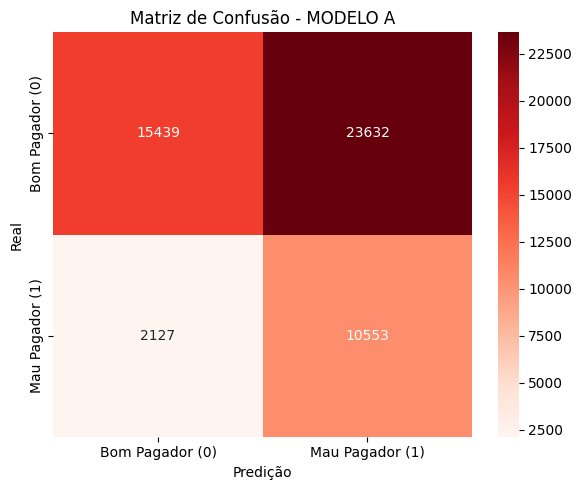

In [51]:
plot_confusion_matrix_lgbm(
    model=lgb_model_A,
    X=X_test,
    y_true=y_test,
    threshold=0.65,
    title='Matriz de Confusão - MODELO A',
    cmap='Reds'
)

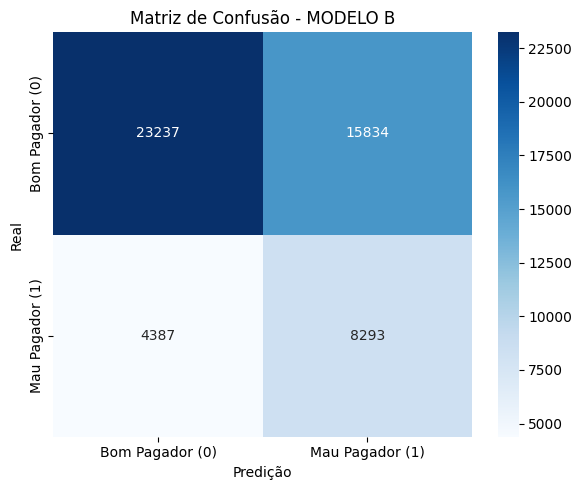

In [52]:
plot_confusion_matrix_lgbm(
    model=lgb_model_B,
    X=X_test,
    y_true=y_test,
    threshold=0.65,
    title='Matriz de Confusão - MODELO B',
    cmap='Blues'
)

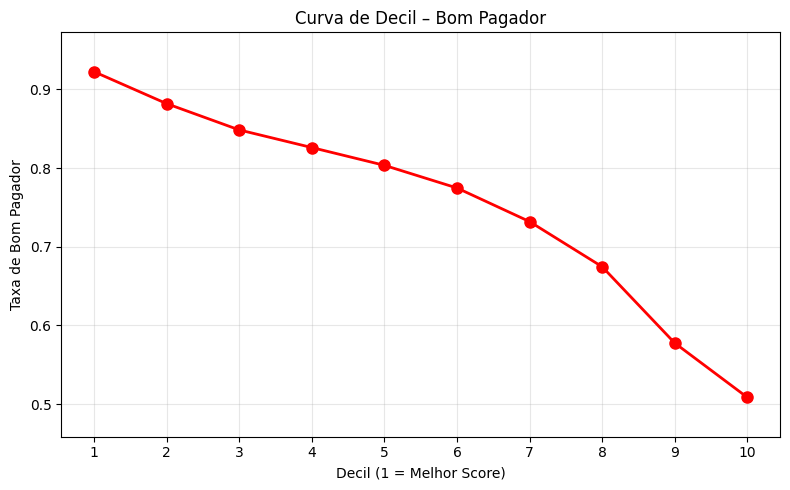

,decil,total,bons_pagadores,maus_pagadores,taxa_bom_pagador,taxa_mau_pagador,cum_total,cum_bons_pagadores,perc_acumulado
0,1,5175,4774,401,0.922512,0.077488,5175,4774,0.122188
1,2,5175,4564,611,0.881932,0.118068,10350,9338,0.239001
2,3,5175,4391,784,0.848502,0.151498,15525,13729,0.351386
3,4,5175,4275,900,0.826087,0.173913,20700,18004,0.460802
4,5,5175,4158,1017,0.803478,0.196522,25875,22162,0.567224
5,6,5175,4009,1166,0.774686,0.225314,31050,26171,0.669832
6,7,5175,3788,1387,0.731981,0.268019,36225,29959,0.766784
7,8,5175,3491,1684,0.674589,0.325411,41400,33450,0.856134
8,9,5175,2989,2186,0.577585,0.422415,46575,36439,0.932635
9,10,5176,2632,2544,0.508501,0.491499,51751,39071,1.000000


In [56]:
decile_table = decile_analysis(
    model=lgb_model_A,
    X=X_test,
    y_true=y_test,
    line_color='red'
)

decile_table

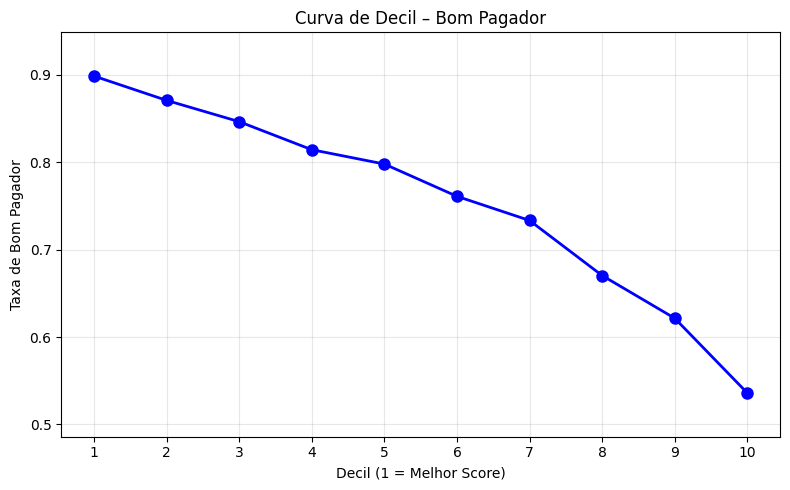

,decil,total,bons_pagadores,maus_pagadores,taxa_bom_pagador,taxa_mau_pagador,cum_total,cum_bons_pagadores,perc_acumulado
0,1,5175,4650,525,0.898551,0.101449,5175,4650,0.119014
1,2,5175,4506,669,0.870725,0.129275,10350,9156,0.234343
2,3,5175,4380,795,0.846377,0.153623,15525,13536,0.346446
3,4,5175,4214,961,0.814300,0.185700,20700,17750,0.454301
4,5,5175,4129,1046,0.797874,0.202126,25875,21879,0.559981
5,6,5175,3938,1237,0.760966,0.239034,31050,25817,0.660771
6,7,5175,3795,1380,0.733333,0.266667,36225,29612,0.757902
7,8,5175,3469,1706,0.670338,0.329662,41400,33081,0.846689
8,9,5175,3216,1959,0.621449,0.378551,46575,36297,0.929001
9,10,5176,2774,2402,0.535935,0.464065,51751,39071,1.000000


In [57]:
decile_table = decile_analysis(
    model=lgb_model_B,
    X=X_test,
    y_true=y_test,
    line_color='blue'
)

decile_table

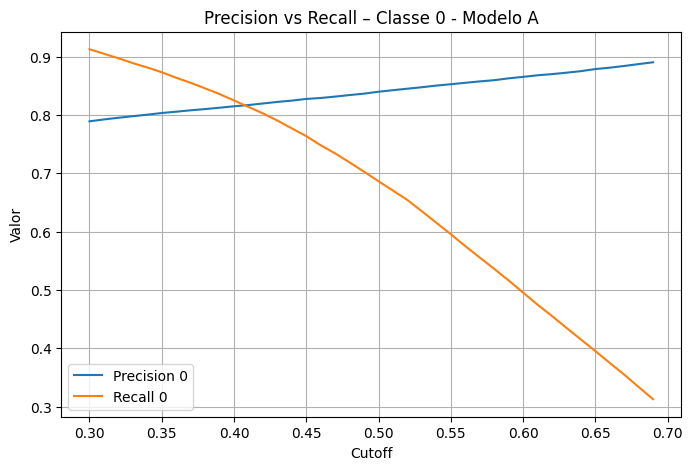

In [58]:
best_cutoff, cutoff_table = find_optimal_cutoff(
    model=lgb_model_A,
    X=X_test,
    y_true=y_test,
    min_recall_0=0.30
)

best_cutoff

plt.figure(figsize=(8, 5))
plt.plot(cutoff_table['cutoff'], cutoff_table['precision_0'], label='Precision 0')
plt.plot(cutoff_table['cutoff'], cutoff_table['recall_0'], label='Recall 0')
plt.xlabel('Cutoff')
plt.ylabel('Valor')
plt.title('Precision vs Recall – Classe 0 - Modelo A')
plt.legend()
plt.grid(True)
plt.show()

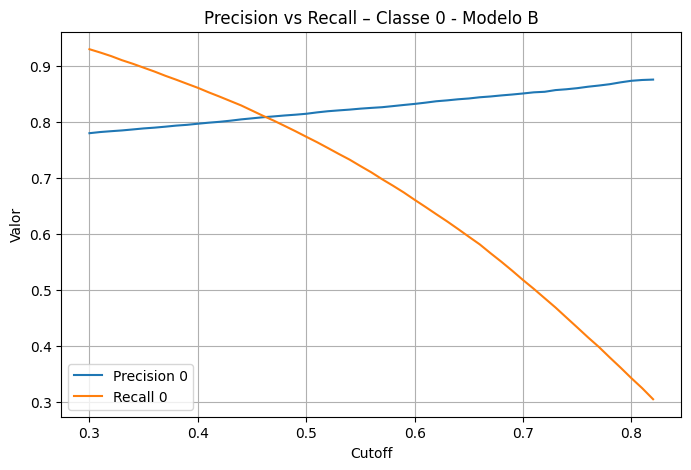

In [59]:
best_cutoff, cutoff_table = find_optimal_cutoff(
    model=lgb_model_B,
    X=X_test,
    y_true=y_test,
    min_recall_0=0.30
)

best_cutoff

plt.figure(figsize=(8, 5))
plt.plot(cutoff_table['cutoff'], cutoff_table['precision_0'], label='Precision 0')
plt.plot(cutoff_table['cutoff'], cutoff_table['recall_0'], label='Recall 0')
plt.xlabel('Cutoff')
plt.ylabel('Valor')
plt.title('Precision vs Recall – Classe 0 - Modelo B')
plt.legend()
plt.grid(True)
plt.show()

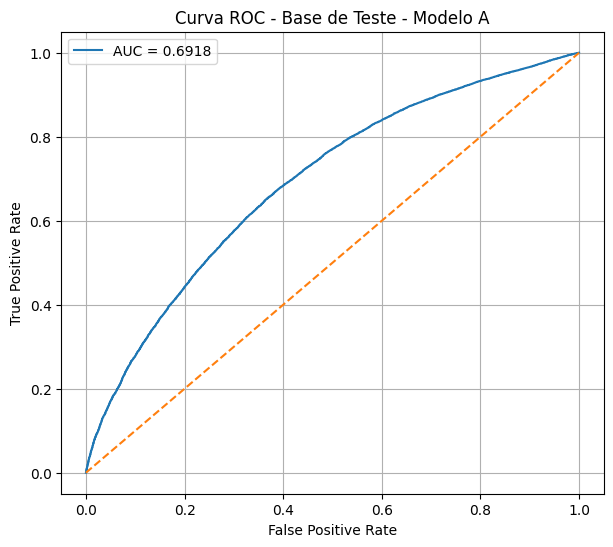

AUC na base de Teste: 0.6918


In [62]:
auc_test = plot_roc_auc(
    model=lgb_model_A,
    X=X_test,
    y_true=y_test,
    title='Curva ROC - Base de Teste - Modelo A'
)

print(f"AUC na base de Teste: {auc_test:.4f}")

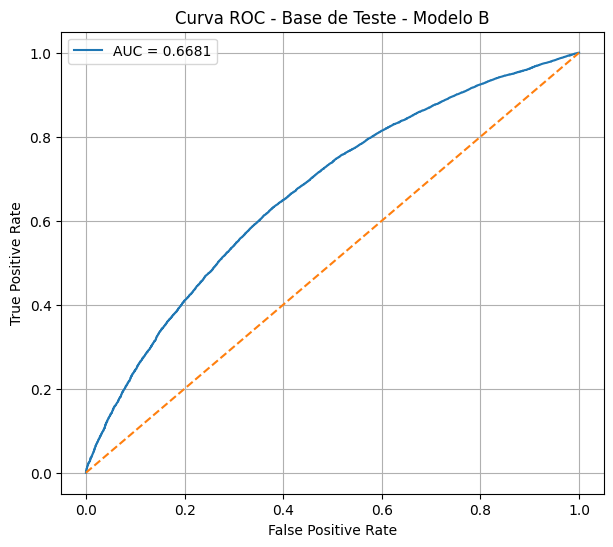

AUC na base de Teste: 0.6681


In [63]:
auc_test = plot_roc_auc(
    model=lgb_model_B,
    X=X_test,
    y_true=y_test,
    title='Curva ROC - Base de Teste - Modelo B'
)

print(f"AUC na base de Teste: {auc_test:.4f}")

**Analise Comparativa Modelo A x Modelo B**


---



**Modelo A**

    Modelo mais Conservador;
    Prioriza redução de risco, mesmo ao custo de rejeitar bons clientes;
    Apresenta:
      - Alto número de FP (bons pagadores classificados como maus);
      - Forte sensibilidade à variação de cutoff.
    Bom para:
      -Reduzir inadimplência;
      -Cenários com: política de crédito extremamente restritiva,
      foco exclusivo em controle de perdas
    Ruim para:
      -Crescimento da carteira
      -Maximização de receita

---
**Modelo B**

    Modelo menos Conservador;
    Apresenta um trade-off mais equilibrado entre precision e recall;
    Apresenta:
      - Menor rejeição indevida de bons pagadores;
      - Curva de decil mais estável ao longo dos decis
      - Menor sensibilidade à variação de cutoff
    Bom para:
      -Crescimento controlado da carteira;
      -Estratégias de crédito segmentadas
    Ruim para:
      -Cenários que exigem aversão extrema ao risco
      -Políticas em que o custo de inadimplência supera fortemente o custo de rejeitar bons clientes


---
**CONCLUSÃO**

    Para crédito o modelo B se mostra mais adequado, pois possui curva decil mais estável e melhor comportamento ao variar o cutoff.



#Analise Financeira

**POLÍTICAS:**



*   **AS-IS:**
    
      Rejeita candidatos com base em uma idade fixa (≤ 28 anos).
*   **TO-BE:**

      Substitui esse critério por um corte baseado em Score. Assim, a aprovação ou reprovação dependerá exclusivamente de o cliente atingir ou não a pontuação mínima definida.



---

**DESCRIÇÃO:**

    Para realizar a análise financeira do seu modelo, considere apenas o mês de agosto de 2017.
    Suponha que todas as pessoas da base de Teste solicitaram crédito à instituição financeira, na forma de um empréstimo de R$1000,00.


---
**ATIVIDADES:**


1.   Calcule qual o tamanho da carteira de crédito aprovado (i.e. quanto de dinheiro a Financeira emprestou) na base de Teste, pela **Política AS-IS**.
2.   Calcule qual a dívida total (suponha que os inadimplentes não pagaram nenhuma parcela do empréstimo), pela **Política AS-IS.**
3.   Calcule qual o percentual das pessoas da base de Teste que tiveram a solicitação negada. Agora crie um ponto de corte de seu Score que negaria o empréstimo para exatamente o mesmo percentual de pessoas. Essa é a **Política TO-BE.**
4.   Calcule o novo tamanho da carteira de crédito aprovado e a dívida total na Política TO-BE. Calcule a economia gerada por seu modelo.






In [ ]:
best_model_path = 'Models/lgbm_model_1.pkl'
best_model = joblib.load(best_model_path)

In [ ]:
path_test = 'Data/data_test_final.csv'
dados_test = pd.read_csv(path_test)
dados_test_copy = dados_test.copy()

## ATIVIDADE 1

**Descrição:**

    Calcule qual o tamanho da carteira de crédito aprovado (i.e. quanto de dinheiro a Financeira emprestou) na base de Teste, pela **Política AS-IS**.


---
**Importante:**

     Considere apenas o mês de agosto de 2017.
     Solicitaram crédito à instituição financeira, na forma de um empréstimo de R$1000,00.


Primeiro vamos definir as fetures que usaremos para essa atividade

In [5]:
features = ['REF_DATE','TARGET','IDADE','ID']

In [6]:
dados_test_clean = dados_test_copy[features]

In [7]:

dados_test_clean['REF_DATE'] = pd.to_datetime(dados_test_clean['REF_DATE'])

dados_test_clean['ANO_MES'] = dados_test_clean['REF_DATE'].dt.to_period('M').astype(str)

dados_test_clean.drop('REF_DATE',axis=1,errors='ignore',inplace=True)

/tmp/ipython-input-370455432.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dados_test_clean['REF_DATE'] = pd.to_datetime(dados_test_clean['REF_DATE'])
/tmp/ipython-input-370455432.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dados_test_clean['ANO_MES'] = dados_test_clean['REF_DATE'].dt.to_period('M').astype(str)
/tmp/ipython-input-370455432.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydat

In [8]:
aprovados_AsIs = dados_test_clean.query(
    'IDADE > 28 and ANO_MES == "2017-08"'
)['ID'].count()
aprovados_AsIs

np.int64(5267)

In [9]:
vTotal_aprovados_AsIs = aprovados_AsIs *1000
print(f'Tamanho da carteira de crédito aprovado (AS-IS): R${vTotal_aprovados_AsIs:,.2f}')

Tamanho da carteira de crédito aprovado (AS-IS): R$5,267,000.00


##ATIVIDADE 2

**Descrição:**

    Calcule qual a dívida total (suponha que os inadimplentes não pagaram nenhuma parcela do empréstimo), pela **Política AS-IS**.


---
**Importante:**

     Considere apenas o mês de agosto de 2017.
     Solicitaram crédito à instituição financeira, na forma de um empréstimo de R$1000,00.


In [10]:
inadimplentes_aprovados_AsIs = dados_test_clean.query(
    'IDADE > 28 and ANO_MES == "2017-08" and TARGET == 1'
)['ID'].count()
inadimplentes_aprovados_AsIs

np.int64(827)

In [11]:
vTotal_divida_AsIs = inadimplentes_aprovados_AsIs *1000
print(f'Tamanho da dívida total (AS-IS): R$ {vTotal_divida_AsIs:,.2f}')

Tamanho da dívida total (AS-IS): R$ 827,000.00


##ATIVIDADE 3

**Descrição:**

    Calcule qual o percentual das pessoas da base de Teste que tiveram a solicitação negada. Agora crie um ponto de corte de seu Score que negaria o empréstimo para exatamente o mesmo percentual de pessoas. Essa é a **Política TO-BE.**


---
**Importante:**

     Considere apenas o mês de agosto de 2017.
     Solicitaram crédito à instituição financeira, na forma de um empréstimo de R$1000,00.


###**Primeira Parte**

In [12]:
negados_AsIs = dados_test_clean.query(
    'IDADE <= 28 and ANO_MES == "2017-08"'
)['ID'].count()
negados_AsIs

np.int64(2038)

In [17]:
total_pessoas_agosto = dados_test_clean.query(
    'ANO_MES == "2017-08"'
)['ID'].count()
total_pessoas_agosto

np.int64(7305)

In [18]:
pct_reprovados_AsIs = (negados_AsIs/total_pessoas_agosto)*100
print(f'Percentual de Reprovados (AS-IS): {pct_reprovados_AsIs:,.2f}%')

Percentual de Reprovados (AS-IS): 27.90%


###**Segunda Parte**

Vamos fazer o modelo se basear apenas no mês de agosto

In [56]:
base_agosto = dados_test_copy\
    .query('"2017-08-01" <= REF_DATE <= "2017-08-31"')\
    .copy()

In [57]:
cat_cols = X_train.select_dtypes(include=['category']).columns.tolist()

for col in cat_cols:
    base_agosto[col] = base_agosto[col].astype('category')
    base_agosto[col] = base_agosto[col].cat.set_categories(
        X_train[col].cat.categories
    )


In [58]:
#Calcular Score de Agosto
FEATURES = X_train.columns.tolist()

base_agosto['score'] = best_model.predict_proba(
    base_agosto[FEATURES]
)[:, 0]

In [59]:
cutOFF_score = base_agosto['score'].quantile(pct_reprovados_AsIs/100)
cutOFF_score

np.float64(0.608088212842308)

In [60]:
#VERIFICANDO SE FOI O MESMO
percentual_negados_ToBe = (base_agosto['score'] < cutOFF_score).mean()

print(f'Percentual negados AS-IS: {pct_reprovados_AsIs/100:.2%}')
print(f'Percentual negados TO-BE: {percentual_negados_ToBe:.2%}')
print(f'Cut-off do score TO-BE: {cutOFF_score:.4f}')


Percentual negados AS-IS: 27.90%
Percentual negados TO-BE: 27.90%
Cut-off do score TO-BE: 0.6081


##ATIVIDADE 4

**Descrição:**

    Calcule o novo tamanho da carteira de crédito aprovado e a dívida total na Política TO-BE. Calcule a economia gerada por seu modelo.


---
**Importante:**

     Considere apenas o mês de agosto de 2017.
     Solicitaram crédito à instituição financeira, na forma de um empréstimo de R$1000,00.


In [70]:
base_agosto['ID'].count()

np.int64(7305)

In [71]:
dados_test_clean.query(
    'ANO_MES == "2017-08"'
)['ID'].count()

np.int64(7305)

In [74]:
#APROVADOS PELO MODELO
aprovados_ToBE = base_agosto.query(
    'score > @cutOFF_score and TARGET == 0'
)['ID'].count()
aprovados_ToBE


np.int64(4472)

In [75]:
#INADIMPLENTES PELO MODELO
inadimplentes_ToBE = base_agosto.query(
    'score > @cutOFF_score and TARGET == 1'
)['ID'].count()
inadimplentes_ToBE

np.int64(795)

In [76]:
aprovados_AsIs

np.int64(5267)

In [77]:
inadimplentes_aprovados_AsIs

np.int64(827)

In [85]:
emprestimo_ToBe = (aprovados_ToBE - inadimplentes_ToBE)*1000
emprestimo_AsIs = (aprovados_AsIs - inadimplentes_aprovados_AsIs)*1000
economia = (inadimplentes_aprovados_AsIs-inadimplentes_ToBE)*1000
print(f'Montante do Empréstimo TO-BE: R${emprestimo_ToBe:,.2f}')
print(f'Montante do Empréstimo AS-IS: R${emprestimo_AsIs:,.2f}')
print(f'Prejuízo TO-BE: R${inadimplentes_ToBE*1000:,.2f}')
print(f'Prejuízo AS-IS: R${inadimplentes_aprovados_AsIs*1000:,.2f}')
print(f'Valor economizado: R${economia:,.2f}')
#

Montante do Empréstimo TO-BE: R$3,677,000.00
Montante do Empréstimo AS-IS: R$4,440,000.00
Prejuízo TO-BE: R$795,000.00
Prejuízo AS-IS: R$827,000.00
Valor economizado: R$32,000.00


##Análise Sobre Desempenho do Modelo

Apesar de o modelo ser mais conservador e aprovar um número menor de clientes para o empréstimo, ele apresenta melhor capacidade de discriminação entre bons e maus pagadores.

Como resultado, a política TO-BE baseada no score reduz o número de inadimplentes aprovados e gera um prejuízo menor quando comparada à política AS-IS baseada exclusivamente na idade.

#Escoragem da base Out-of-time

**Descrição:**

    Nesta etapa é realizada a inferência do modelo utilizando dados nunca vistos, provenientes de um período temporal não utilizado nas fases de treinamento e teste.

In [ ]:
best_model_path = 'Models/lgbm_model_1.pkl'
best_model = joblib.load(best_model_path)

In [ ]:
path_oot = 'Data/data_oot_final.csv'
dados_oot = pd.read_csv(path_oot)
base_oot = dados_oot.copy()

In [91]:
#Preparando Base oot para previsão
FEATURES = X_train.columns.tolist()

cat_cols = X_train.select_dtypes(
    include=['object', 'category']
).columns.tolist()

for col in cat_cols:
    base_oot[col] = base_oot[col].astype('category')

base_oot = base_oot[FEATURES]

In [93]:
#Calculando Score
base_oot['score'] = best_model.predict_proba(
    base_oot
)[:, 0]


##Avaliando Performace

In [94]:
base_oot['score'].describe()

,score
count,91965.000000
mean,0.687429
std,0.176888
min,0.103583
25%,0.557751
50%,0.708052
75%,0.832513
max,0.999050


In [95]:
base_oot['APROVADO_TO_BE'] = (
    base_oot['score'] >= cutOFF_score
).astype(int)


In [108]:
base_oot.groupby('APROVADO_TO_BE')['APROVADO_TO_BE'].count()

,APROVADO_TO_BE
APROVADO_TO_BE,
0,29896
1,62069


###Vendo Comportamento ao Longo do Tempo

In [109]:
base_oot['ANO_MES'] = (
    pd.to_datetime(base_oot['REF_DATE'])
      .dt.to_period('M')
      .astype(str)
)

In [110]:
resumo_mensal = (
    base_oot
    .groupby('ANO_MES')['APROVADO_TO_BE']
    .agg(
        APROVADOS='sum',
        TOTAL='count'
    )
    .reset_index()
)

resumo_mensal['REPROVADOS'] = (
    resumo_mensal['TOTAL'] - resumo_mensal['APROVADOS']
)


In [112]:
df_plot = resumo_mensal.melt(
    id_vars='ANO_MES',
    value_vars=['APROVADOS', 'REPROVADOS'],
    var_name='STATUS',
    value_name='QTD_CLIENTES'
)

fig = px.bar(
    df_plot,
    x='ANO_MES',
    y='QTD_CLIENTES',
    color='STATUS',
    title='Aprovados vs Reprovados por Mês — Política TO-BE (OOT)',
    labels={
        'ANO_MES': 'Mês',
        'QTD_CLIENTES': 'Quantidade de Clientes',
        'STATUS': 'Status do Crédito'
    }
)

fig.update_layout(
    barmode='group',
    xaxis_tickangle=-45
)

fig.show()

Vamos pegar o contexto da Análise Financeira anterior e ver quanto o modelo economizaria por mês.

###Analise Finaceira

In [113]:
base_oot['APROVADO_AS_IS'] = (
    base_oot['IDADE'] > 28
).astype(int)

In [115]:
#APROVADOS PELAS POLTICIAS IS-AS E TO-BE AO LONGO DO TEMPO
resumo_as_is = (
    base_oot
    .groupby('ANO_MES')['APROVADO_AS_IS']
    .mean()
    .reset_index(name='TAXA_APROVACAO')
)

resumo_as_is['POLITICA'] = 'AS-IS'


resumo_to_be = (
    base_oot
    .groupby('ANO_MES')['APROVADO_TO_BE']
    .mean()
    .reset_index(name='TAXA_APROVACAO')
)

resumo_to_be['POLITICA'] = 'TO-BE'


resumo_mensal = pd.concat(
    [resumo_as_is, resumo_to_be],
    ignore_index=True
)



In [ ]:
fig = px.line(
    resumo_mensal,
    x='ANO_MES',
    y='TAXA_APROVACAO',
    color='POLITICA',
    markers=True,
    title='Simulação da Taxa de Aprovação Mensal — AS-IS vs TO-BE (OOT)',
    labels={
        'ANO_MES': 'Mês',
        'TAXA_APROVACAO': 'Taxa de Aprovação',
        'POLITICA': 'Política de Crédito'
    }
)

fig.update_layout(
    yaxis=dict(range=[0, 1]),
    xaxis_tickangle=-45
)

fig.show()


**Interpretação do Gráfico**

    A política TO-BE, mais conservadora, tem uma taxa de aprovação menor que a AS-IS.
    Entretanto, a diferença entre elas é estável ao longo do tempo, mostrando robustez.

    Ademais, o modelo se mostra estável ao decorrer do tempo.
    Além disso, mesmo aprovando menos, a política TO-BE reduz o prejuízo financeiro, o que é positivo para o risco.